In [ ]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

## using this notebook:
If you want to check or use some of my the code run the cells from TASK 1 down where it says "Import scrapped data: ***(Start Here)***"

## To Do:
- GenAI Use Statement (Project 3) You won't get a grade if oyu don't submit this before the deadline!!
- Project 3 TeamMember Evaluation Sheet Submission
- Class Presentations Marking Sheet Submission
- creating slides
<br>
<br>
<br>
<br>
<br>
#### Group

#### Student 1 name: \<Daniel Shippey >
#### Student 1 ID: \<04175484 >
#### Student 2 name: \< Josh Smith >
#### Student 2 ID: \< 24023949 >
#### Student 3 name: \<Oscar Ironside>
#### Student 3 ID: \<22011234>
#### Student 4 name: \<Hibba Asad>
#### Student 4 ID: \<24016472>
<br>
<br>



#### Work By Josh S
#### Student 2 name: \< Josh Smith >
#### Student 2 ID: \< 24023949 >

# IMPORTS:

In [ ]:
!pip install selenium

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.4/9.4 MB 59.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 499.2/499.2 kB 27.2 MB/s eta 0:00:00


In [ ]:
# Scrapping Libraries
from selenium import webdriver
from selenium.webdriver.chrome.options import Options
from bs4 import BeautifulSoup # Creates structured, searchable object
# Files and basic libraries
import time
from io import StringIO
import os
import json
#Dataframe Libraries
import numpy as np
import pandas as pd
# Visualisation Librarries
import matplotlib.pyplot as plt
import seaborn as sns
#Stats Modelling
from pylab import rcParams
import scipy.stats as stats
import statsmodels.api as sm
import statsmodels.formula.api as smf
from datetime import datetime, timedelta

ModuleNotFoundError: No module named 'selenium'

In [ ]:
# Scrapping Libraries
from selenium import webdriver
from selenium.webdriver.chrome.options import Options
from bs4 import BeautifulSoup # Creates structured, searchable object
#!pip install selenium

# Deprecated Web Scrapping (Too grand in scope)

In [ ]:
#set dates to pull:
start_date = datetime(2021, 1, 1)
end_date   = datetime(2021, 12, 31)
# turn into list of dates in YYYYMMDD (url format)
num_days = (end_date - start_date).days + 1
dates = [
    (start_date + timedelta(days=i)).strftime('%Y%m%d')
    for i in range(num_days)
]

headers = {
    'User-Agent': (
        'Mozilla/5.0 (Windows NT 10.0; Win64; x64) '
        'AppleWebKit/537.36 (KHTML, like Gecko) '
        'Chrome/91.0.4472.124 Safari/537.36'
    )
}

all_tables = []

for ds in dates:
    url = f"https://www.espn.com/soccer/schedule/_/date/{ds}"
    print(f"Going to {url} …", end=" ")

    resp = requests.get(url, headers=headers)
    if resp.status_code != 200:
        print(f"FAILED ({resp.status_code})")
        continue

    soup = BeautifulSoup(resp.content, 'html.parser')
    sections = soup.select('div.ResponsiveTable')
    print(f"Found {len(sections)} sections")

    formatted_date = f"{ds[:4]}-{ds[4:6]}-{ds[6:]}"

    for sec in sections:
        league_tag = sec.find_previous('div', class_='Table__Title')
        league = league_tag.text.strip() if league_tag else "Unknown League"
        cols = [th.get_text(strip=True) for th in sec.select('th')]
        rows = []
        for tr in sec.select('tr'):
            cells = [td.get_text(strip=True) for td in tr.select('td')]
            if not cells:
                continue
            if len(cells) < len(cols): #padding
                cells += [''] * (len(cols) - len(cells))
            else:
                cells = cells[:len(cols)]
            rows.append(cells)

        if rows:
            df = pd.DataFrame(rows, columns=cols)
            df = df[df.iloc[:, 1].str.strip().astype(bool)]#was getting blank rows
            df['League'] = league
            df['Date'] = formatted_date
            all_tables.append(df)

    # small random delay, except after last date
    if ds != dates[-1]:
        delay = random.uniform(1, 3)
        print(f"Waiting {delay:.2f}s")
        time.sleep(delay)

# combine and report
if all_tables:
    combined = pd.concat(all_tables, ignore_index=True)
    print("\nSCRAPING SUM: ")
    print(f" Days scraped:   {combined['Date'].nunique()}")
    print(f" Leagues found:  {combined['League'].nunique()}")
    print(f" Total matches:  {len(combined)}")
else:
    print("No data.")


combined_df = pd.concat(all_tables, ignore_index=True) #combine all
combined_df[['Score', 'Team_B']] = combined_df['result'].str.extract(r'(\d+ - \d+)(.+)') # Split the result column into Score and Team_B
combined_df[['Team_A_Score', 'Team_B_Score']] = combined_df['Score'].str.split(' - ', n=1, expand=True)

combined_df = combined_df.rename(columns={'MATCH': 'Team_A'}) # renaming
combined_df = combined_df[['Team_A', 'Team_A_Score', 'Team_B', 'Team_B_Score', 'location', 'ATT', 'League', 'Score', 'Date']] #reorder
combined_df[['location', 'ATT']] = combined_df[['ATT', 'location']] #flippping naming
combined_df.head(5)

combined_df.to_csv('Match_2021.csv', index=False)
combined_df.describe()

# Web Scrapping

In [ ]:
seasons = {
    "Premier League": [
        "https://fbref.com/en/comps/9/2023-2024/2023-2024-Premier-League-Stats",
        "https://fbref.com/en/comps/9/2022-2023/2022-2023-Premier-League-Stats",
        "https://fbref.com/en/comps/9/2021-2022/2021-2022-Premier-League-Stats"
    ],
    "La Liga": [
        "https://fbref.com/en/comps/12/2023-2024/2023-2024-La-Liga-Stats",
        "https://fbref.com/en/comps/12/2022-2023/2022-2022-La-Liga-Stats",
        "https://fbref.com/en/comps/12/2021-2022/2021-2022-La-Liga-Stats"
    ]
}

all_seasons_data = []

# Setup headless selenium using chrome driver
options = Options()
options.add_argument("--headless")
#google colab req
options.add_argument("--no-sandbox")
options.add_argument("--disable-dev-shm-usage")
driver = webdriver.Chrome(options=options)


for league, urls in seasons.items():
    for url in urls:
        driver.get(url)
        time.sleep(5)
        soup = BeautifulSoup(driver.page_source, "html.parser")

        tables = { #find tables using html div tag
            "keeper": soup.find("table", {"id": "stats_squads_keeper_adv_for"}),
            "shooting": soup.find("table", {"id": "stats_squads_shooting_for"}),
            "passing": soup.find("table", {"id": "stats_squads_passing_for"}),
            "shot_creation": soup.find("table", {"id": "stats_squads_gca_for"}),
            "possession": soup.find("table", {"id": "stats_squads_possession_for"}),
            "playtime": soup.find("table", {"id": "stats_squads_playing_time_for"}),
        }

        season_data = {}
        for name, table in tables.items(): #Converts HTML tables to df
            if table is not None:
                df = pd.read_html(StringIO(str(table)))[0]
                df["League"] = league
                df["Season"] = url.split("/")[6] #pull te season-date from url
                season_data[name] = df

        all_seasons_data.append(season_data)

driver.quit()

#for season in all_seasons_data: #loop through tables description
#        display(season["keeper"].describe(include='all'))
#        display(season["shooting"].describe(include='all'))
#        display(season["passing"].describe(include='all'))
#        display(season["shot_creation"].describe(include='all'))
#        display(season["possession"].describe(include='all'))
#        display(season["playtime"].describe(include='all'))



# Export Scrapped Data

In [ ]:
# create folder
output_dir = "fbref_data"
os.makedirs(output_dir, exist_ok=True)

for season in all_seasons_data: # Loop saving each df as a csv
    for table_name, df in season.items():
        # Clean League, Season
        league = str(df["League"].iloc[0]).strip().replace(" ", "_")
        season_year = str(df["Season"].iloc[0])

        # create filename, output
        filename = f"{league}_{season_year}_{table_name}.csv"
        filepath = os.path.join(output_dir, filename)
        # sav csv
        df.to_csv(filepath, index=False)
        print(f"Saved: {filename}")


# Import Scrapped Data for: Data Cleaning, Sanity Checks, looking for errors and inconsistencies

In [ ]:
#eac csv is consistent
leagues = ['Premier_League', 'La_Liga']
seasons = ['2023-2024', '2022-2023', '2021-2022']
data_types = ['keeper', 'shooting', 'passing', 'shot_creation', 'possession', 'playtime']

# dict to save dfs to
dataframes = {}

for league in leagues: #loop through both leagues
    for season in seasons: #loop through all 3 seasons
        for data_type in data_types: #loop through all 6 table types
            filename = f'{league}_{season}_{data_type}.csv'
            i = f'{league}_{season}_{data_type}'
            dataframes[i] = pd.read_csv(filename)

In [ ]:
with pd.option_context('display.max_columns', None): #checking table how botched the table is
    display(dataframes['Premier_League_2023-2024_playtime'].head())

,Unnamed: 0_level_0,Unnamed: 1_level_0,Unnamed: 2_level_0,Playing Time,Playing Time.1,Playing Time.2,Playing Time.3,Playing Time.4,Starts,Starts.1,Starts.2,Subs,Subs.1,Subs.2,Team Success,Team Success.1,Team Success.2,Team Success.3,Team Success.4,Team Success (xG),Team Success (xG).1,Team Success (xG).2,Team Success (xG).3,League,Season
0,Squad,# Pl,Age,MP,Min,Mn/MP,Min%,90s,Starts,Mn/Start,Compl,Subs,Mn/Sub,unSub,PPM,onG,onGA,+/-,+/-90,onxG,onxGA,xG+/-,xG+/-90,NaN,NaN
1,Arsenal,25,25.0,38,3420,90,100,38.0,418,84,263,154,17,188,2.34,91,29,62,1.63,76.1,27.9,48.2,1.27,Premier League,2023-2024
2,Aston Villa,31,26.9,38,3420,90,100,38.0,418,83,270,151,19,186,1.79,76,61,15,0.39,63.3,59.9,3.4,0.09,Premier League,2023-2024
3,Bournemouth,30,25.7,38,3420,90,100,38.0,418,82,247,170,20,171,1.26,54,67,-13,-0.34,55.9,58.1,-2.2,-0.06,Premier League,2023-2024
4,Brentford,28,26.6,38,3420,90,100,38.0,418,83,247,170,16,172,1.03,56,65,-9,-0.24,58.2,56.0,2.2,0.06,Premier League,2023-2024


## Cleaning

In [ ]:
# --- cleaning ---
for i in dataframes: # resetting column headers, luckily same for every table
    df = dataframes[i]
    df.columns = df.iloc[0]  # Set first row as header for every table
    dataframes[i] = df.drop(index=0).reset_index(drop=True)  # Drop first row and reset index

# Rename last two columns  for all data
for i in dataframes:
    df = dataframes[i]
    cols = df.columns.tolist()
    cols[-2] = 'League'
    cols[-1] = 'Season'
    df.columns = cols
    dataframes[i] = df  #updating df dictionary

# -- combining -lazy verbose ---
#data_types = ['keeper', 'shooting', 'passing', 'shot_creation', 'possession', 'playtime']
# for every keeper df, Combine them
keeper_index = ['La_Liga_2021-2022_keeper','La_Liga_2022-2023_keeper','La_Liga_2023-2024_keeper','Premier_League_2021-2022_keeper','Premier_League_2022-2023_keeper','Premier_League_2023-2024_keeper']
keeper_combined = pd.concat([dataframes[i] for i in keeper_index], axis=0).reset_index(drop=True)
# for every sohoter df, combine
shooting_index = ['La_Liga_2021-2022_shooting','La_Liga_2022-2023_shooting','La_Liga_2023-2024_shooting','Premier_League_2021-2022_shooting','Premier_League_2022-2023_shooting','Premier_League_2023-2024_shooting']
shooting_combined = pd.concat([dataframes[i] for i in shooting_index], axis=0).reset_index(drop=True)
# for every passing df, combine
passing_index = ['La_Liga_2021-2022_passing','La_Liga_2022-2023_passing','La_Liga_2023-2024_passing','Premier_League_2021-2022_passing','Premier_League_2022-2023_passing','Premier_League_2023-2024_passing']
passing_combined = pd.concat([dataframes[i] for i in passing_index], axis=0).reset_index(drop=True)
# for every shot_creation df, combine
shot_creation_index = ['La_Liga_2021-2022_shot_creation','La_Liga_2022-2023_shot_creation','La_Liga_2023-2024_shot_creation','Premier_League_2021-2022_shot_creation','Premier_League_2022-2023_shot_creation','Premier_League_2023-2024_shot_creation']
shot_creation_combined = pd.concat([dataframes[i] for i in shot_creation_index], axis=0).reset_index(drop=True)
# for every possession df, combine
possession_index = ['La_Liga_2021-2022_possession','La_Liga_2022-2023_possession','La_Liga_2023-2024_possession','Premier_League_2021-2022_possession','Premier_League_2022-2023_possession','Premier_League_2023-2024_possession']
possession_combined = pd.concat([dataframes[i] for i in possession_index], axis=0).reset_index(drop=True)
# for every playtime df, combine
playtime_index = ['La_Liga_2021-2022_playtime','La_Liga_2022-2023_playtime','La_Liga_2023-2024_playtime','Premier_League_2021-2022_playtime','Premier_League_2022-2023_playtime','Premier_League_2023-2024_playtime']
playtime_combined = pd.concat([dataframes[i] for i in playtime_index], axis=0).reset_index(drop=True)
keeper_combined.shape

(120, 30)

In [ ]:
with pd.option_context('display.max_columns', None):
    display(keeper_combined.describe())
    display(shooting_combined.describe())
    display(passing_combined.describe())
    display(shot_creation_combined.describe())
    display(possession_combined.describe())
    display(playtime_combined.describe())
#checking all dfs have 120 rows, (20 teams) * (3 seasons) * (2 leagues)

,Squad,# Pl,90s,GA,PKA,FK,CK,OG,PSxG,PSxG/SoT,PSxG+/-,/90,Cmp,Att,Cmp%,Att (GK),Thr,Launch%,AvgLen,Att,Launch%,AvgLen,Opp,Stp,Stp%,#OPA,#OPA/90,AvgDist,League,Season
count,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120
unique,49,4,1,51,11,5,16,8,108,14,95,53,96,107,86,113,79,104,98,84,114,107,99,39,55,56,56,70,2,3
top,Athletic Club,2,38.0,43,2,0,8,1,47.5,0.29,-1.5,0.02,170,553,33.7,748,167,44.0,33.8,283,50.9,43.9,534,30,7.2,45,1.18,15.2,La Liga,2021-2022
freq,3,74,120,8,19,60,17,35,3,24,4,8,2,4,4,2,4,3,4,5,2,3,4,9,6,6,6,4,60,40


,Squad,# Pl,90s,Gls,Sh,SoT,SoT%,Sh/90,SoT/90,G/Sh,G/SoT,Dist,FK,PK,PKatt,xG,npxG,npxG/Sh,G-xG,np:G-xG,League,Season
count,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120
unique,49,16,1,51,96,73,74,96,73,11,26,43,26,12,13,103,105,9,99,97,2,3
top,Athletic Club,26,38.0,40,430,133,31.8,11.32,3.5,0.08,0.3,17.7,14,3,5,36.7,57.9,0.1,0.8,-6.4,La Liga,2021-2022
freq,3,18,120,6,5,5,4,5,5,22,13,8,14,25,21,3,2,32,3,4,60,40


,Squad,# Pl,90s,Cmp,Att,Cmp%,TotDist,PrgDist,Cmp,Att,Cmp%,Cmp,Att,Cmp%,Cmp,Att,Cmp%,Ast,xAG,xA,A-xAG,KP,1/3,PPA,CrsPA,PrgP,League,Season
count,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120
unique,49,16,1,120,120,93,120,120,118,119,71,120,120,79,111,115,92,45,94,99,88,95,111,94,61,111,2,3
top,Athletic Club,26,38.0,9676,14175,80.8,191044,85739,10630,11617,86.8,3774,4954,84.4,1330,2800,48.1,36,32.5,31.6,-4.4,316,835,212,81,1129,La Liga,2021-2022
freq,3,18,120,1,1,3,1,1,2,2,4,1,1,4,3,2,5,7,5,4,4,3,2,4,5,2,60,40


,Squad,# Pl,90s,SCA,SCA90,PassLive,PassDead,TO,Sh,Fld,Def,GCA,GCA90,PassLive,PassDead,TO,Sh,Fld,Def,League,Season
count,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120
unique,49,16,1,105,105,104,50,49,47,36,22,70,70,64,13,17,16,14,6,2,3
top,Athletic Club,26,38.0,817,21.5,475,67,47,42,42,11,69,1.82,45,3,4,8,6,1,La Liga,2021-2022
freq,3,18,120,3,3,3,6,8,6,9,16,6,6,5,20,20,19,21,32,60,40


,Squad,# Pl,Poss,90s,Touches,Def Pen,Def 3rd,Mid 3rd,Att 3rd,Att Pen,Live,Att,Succ,Succ%,Tkld,Tkld%,Carries,TotDist,PrgDist,PrgC,1/3,CPA,Mis,Dis,Rec,PrgR,League,Season
count,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120
unique,49,16,104,1,119,109,118,118,118,109,120,103,94,87,84,73,120,120,120,106,105,91,91,87,119,118,2,3
top,Athletic Club,26,50.6,38.0,18371,2493,7880,8320,4471,746,18364,530,297,56.8,282,43.9,8699,42737,20539,610,449,102,588,341,12047,1580,La Liga,2021-2022
freq,3,18,5,120,2,2,2,2,2,3,1,2,4,3,3,6,1,1,1,3,2,3,3,3,2,2,60,40


,Squad,# Pl,Age,MP,Min,Mn/MP,Min%,90s,Starts,Mn/Start,Compl,Subs,Mn/Sub,unSub,PPM,onG,onGA,+/-,+/-90,onxG,onxGA,xG+/-,xG+/-90,League,Season
count,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120,120
unique,49,16,45,1,1,1,1,1,1,9,62,61,14,76,63,55,51,64,64,103,102,111,87,2,3
top,Athletic Club,26,26.7,38,3420,90,100,38.0,418,81,238,179,19,255,1.03,43,43,-11,-0.29,36.7,45.7,-8.7,-0.06,La Liga,2021-2022
freq,3,18,8,120,120,120,120,120,120,28,5,6,23,3,6,6,8,6,6,3,4,2,5,60,40


# Export Cleaned Tables

In [ ]:
keeper_combined.to_csv('keeper_combined.csv', index=False)
shooting_combined.to_csv('shooting_combined.csv', index=False)
passing_combined.to_csv('passing_combined.csv', index=False)
shot_creation_combined.to_csv('shot_creation_combined.csv', index=False)
possession_combined.to_csv('possession_combined.csv', index=False)
playtime_combined.to_csv('playtime_combined.csv', index=False)

# Feature Engineering

### Keepers Dataframe

In [ ]:
#keeper_combined = pd.read_csv('keeper_combined.csv')

Problems with 90s Column

In [ ]:
#this column is giving me a headache, it's all the same '38.0' and as a float [38.], but when I convert to numeric all NaNs?
#Would love to know where I'm messing up?

# Tried: Removing whitespace, converting to numeric
keeper_combined['90s'] = keeper_combined['90s'].str.strip()
keeper_combined['90s'] = pd.to_numeric(keeper_combined['90s'], errors='coerce')

print(keeper_combined['90s'].unique())
print(keeper_combined['90s'].dtype)
#Since the column doesn't contin any valuable data, I'm just dropping it and moving on
keeper_combined = keeper_combined.drop('90s', axis=1)

[38.]
float64


Column Renaming, Keepers table

In [ ]:
new_column_names = ['Squad','Num_Goalkeepers','Goals_Against','Penalty_Kicks_Allowed','Free_Kick_Goal_Against','Corner_Kick_Goals_Against','Own_Goals',
    #Expected
    'EXP_Post_Shot_Goals','EXP_Post_Shot_per_Shot_on_Target','EXP_Post_Shot_Minus_Goals_Allowed','EXP_Post_Shot_Minus_Goals_Allowed_Per_90_Minutes',
    #Launched
    'Passes_Completed_Over_40yrds','Passes_Attempted_Over_40yrds','Pass_Completion_percent_Over_40yrds',
    #Passes
    'Passes_Attempted','Throws_Attempted','Launched_Passes_percent','Average_Length_Pass',
    #Goal Kicks
    'Goal_kicks_Attempted','Goal_kicks_Launched_percent','Goal_Kicks_Average_Length',
    #Crosses
    'Crosses_Faced','Crosses_Stopped','Crosses_Stopped_percent',
    #Sweeper
    'Num_Defensive_Actions_Outside_PA','Num_Defensive_Actions_Outside_PA_Per_90','Avg_Def_Dist_From_Goal','League','Season']

keeper_combined.columns = new_column_names

One Hot Encoding for 'Squad' Column

In [ ]:
keeper_combined_dummies = pd.get_dummies(keeper_combined, columns=['Squad'], prefix='Squad')
with pd.option_context('display.max_columns', None):
        display(keeper_combined.head())
# scroll for squad cols -------->>>>

,Squad,Num_Goalkeepers,Goals_Against,Penalty_Kicks_Allowed,Free_Kick_Goal_Against,Corner_Kick_Goals_Against,Own_Goals,EXP_Post_Shot_Goals,EXP_Post_Shot_per_Shot_on_Target,EXP_Post_Shot_Minus_Goals_Allowed,EXP_Post_Shot_Minus_Goals_Allowed_Per_90_Minutes,Passes_Completed_Over_40yrds,Passes_Attempted_Over_40yrds,Pass_Completion_percent_Over_40yrds,Passes_Attempted,Throws_Attempted,Launched_Passes_percent,Average_Length_Pass,Goal_kicks_Attempted,Goal_kicks_Launched_percent,Goal_Kicks_Average_Length,Crosses_Faced,Crosses_Stopped,Crosses_Stopped_percent,Num_Defensive_Actions_Outside_PA,Num_Defensive_Actions_Outside_PA_Per_90,Avg_Def_Dist_From_Goal,League,Season
0,Alavés,3,65,6,0,10,0,58.5,0.3,-6.5,-0.17,369,783,47.1,808,96,64.6,53.3,351,74.4,50.9,619,26,4.2,48,1.26,17.6,La Liga,2021-2022
1,Athletic Club,2,36,3,0,2,1,36.9,0.26,1.9,0.05,158,402,39.3,748,201,35.4,33.8,269,50.9,41.7,577,30,5.2,41,1.08,15.2,La Liga,2021-2022
2,Atlético Madrid,1,43,7,2,4,3,32.3,0.23,-7.7,-0.2,170,598,28.4,810,155,49.9,39.0,283,68.6,48.6,477,27,5.7,29,0.76,13.8,La Liga,2021-2022
3,Barcelona,2,38,2,1,7,0,34.1,0.26,-3.9,-0.1,147,289,50.9,1167,165,18.8,26.9,240,29.2,32.3,384,15,3.9,38,1.0,15.3,La Liga,2021-2022
4,Betis,2,40,3,0,3,2,39.1,0.27,1.1,0.03,201,547,36.7,962,157,41.4,33.1,275,54.2,43.9,592,24,4.1,41,1.08,15.7,La Liga,2021-2022


Just going to map 1 and 0 to the League categorical data column. Repeat and inverse it to make it really clear what the correlation numbers are showing. Would Be interesting to do season aswell

In [ ]:
keeper_combined['Premier League'] = keeper_combined['League'].map({'La Liga': 0, 'Premier League': 1})
keeper_combined['La Liga'] = keeper_combined['League'].map({'La Liga': 1, 'Premier League': 0})
keeper_combined.rename(columns={'Premier League': 'Premier_League', 'La Liga': 'La_Liga'}, inplace=True)


# Correlation Matrix

In [ ]:
numeric_df = keeper_combined.apply(pd.to_numeric, errors='coerce').convert_dtypes() #convert keeper_combined to numeric
numeric_df = numeric_df.drop(['Season','League'], axis=1) #drop non numeric columns

#Create a correlation matrix of only the numeric data
numeric_df = numeric_df.select_dtypes(include='number') # select only numeric data
corr_matrix = numeric_df.corr() #Correlation Matrix
with pd.option_context('display.max_columns', None):
    display(corr_matrix.head(120))

,Squad,Num_Goalkeepers,Goals_Against,Penalty_Kicks_Allowed,Free_Kick_Goal_Against,Corner_Kick_Goals_Against,Own_Goals,EXP_Post_Shot_Goals,EXP_Post_Shot_per_Shot_on_Target,EXP_Post_Shot_Minus_Goals_Allowed,EXP_Post_Shot_Minus_Goals_Allowed_Per_90_Minutes,Passes_Completed_Over_40yrds,Passes_Attempted_Over_40yrds,Pass_Completion_percent_Over_40yrds,Passes_Attempted,Throws_Attempted,Launched_Passes_percent,Average_Length_Pass,Goal_kicks_Attempted,Goal_kicks_Launched_percent,Goal_Kicks_Average_Length,Crosses_Faced,Crosses_Stopped,Crosses_Stopped_percent,Num_Defensive_Actions_Outside_PA,Num_Defensive_Actions_Outside_PA_Per_90,Avg_Def_Dist_From_Goal,Premier_League,La_Liga
Squad,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Num_Goalkeepers,NaN,1.000000,0.224058,0.045351,0.056257,0.107379,-0.079209,0.185191,0.202736,-0.201396,-0.202040,0.089190,0.057629,0.113520,-0.140743,0.039705,0.085129,0.090693,0.205657,0.098647,0.085447,0.170196,0.021908,-0.053352,-0.138522,-0.138523,-0.074158,-0.170986,0.170986
Goals_Against,NaN,0.224058,1.000000,0.387720,0.123968,0.595688,0.331068,0.909565,0.491131,-0.564116,-0.565140,0.188673,0.338585,-0.323801,-0.035465,0.006062,0.285409,0.307341,0.541845,0.253757,0.194211,0.483673,0.073127,-0.161375,-0.051484,-0.051158,-0.077387,0.282254,-0.282254
Penalty_Kicks_Allowed,NaN,0.045351,0.387720,1.000000,0.060837,0.184731,0.012594,0.477976,-0.143076,0.007761,0.008141,0.140600,0.215019,-0.172753,-0.066991,0.001958,0.219739,0.221688,0.352444,0.156550,0.127448,0.334996,0.041698,-0.118854,-0.146284,-0.146360,0.010152,-0.030189,0.030189
Free_Kick_Goal_Against,NaN,0.056257,0.123968,0.060837,1.000000,0.105462,0.067005,0.042696,-0.081457,-0.205951,-0.205950,-0.135668,-0.048283,-0.258192,-0.004968,0.163806,-0.051149,-0.030050,0.101205,-0.078697,-0.088571,0.050526,0.029302,-0.002369,-0.114022,-0.113870,-0.057445,0.191924,-0.191924
Corner_Kick_Goals_Against,NaN,0.107379,0.595688,0.184731,0.105462,1.000000,0.219024,0.493576,0.206947,-0.428740,-0.431287,0.209367,0.278233,-0.159663,-0.004899,-0.080191,0.251880,0.220153,0.315663,0.206595,0.151418,0.346112,0.138843,-0.028244,0.033798,0.034019,-0.037750,0.286144,-0.286144
Own_Goals,NaN,-0.079209,0.331068,0.012594,0.067005,0.219024,1.000000,0.216706,0.125852,-0.142248,-0.140136,0.042607,0.119658,-0.178033,0.106924,-0.026261,0.082809,0.070230,0.027750,0.075778,0.045527,0.006275,0.023788,0.033422,0.132430,0.131709,0.002872,0.266282,-0.266282
EXP_Post_Shot_Goals,NaN,0.185191,0.909565,0.477976,0.042696,0.493576,0.216706,1.000000,0.552257,-0.182787,-0.184384,0.177147,0.332596,-0.347789,0.015393,0.039750,0.257328,0.296781,0.579102,0.237105,0.192131,0.525286,0.109824,-0.148247,-0.026787,-0.026557,-0.129884,0.177942,-0.177942
EXP_Post_Shot_per_Shot_on_Target,NaN,0.202736,0.491131,-0.143076,-0.081457,0.206947,0.125852,0.552257,1.000000,-0.071581,-0.075172,-0.054185,0.031154,-0.214262,0.082992,-0.024615,-0.010265,0.059580,0.119070,-0.004781,-0.016929,0.059259,-0.028674,-0.031089,0.183189,0.183313,-0.098302,0.128898,-0.128898
EXP_Post_Shot_Minus_Goals_Allowed,NaN,-0.201396,-0.564116,0.007761,-0.205951,-0.428740,-0.142248,-0.182787,-0.071581,1.000000,0.999821,-0.100005,-0.139134,0.057266,0.145587,0.059269,-0.168448,-0.146015,-0.167230,-0.132357,-0.082659,-0.136789,0.046624,0.109125,0.106014,0.105493,-0.070288,-0.277338,0.277338


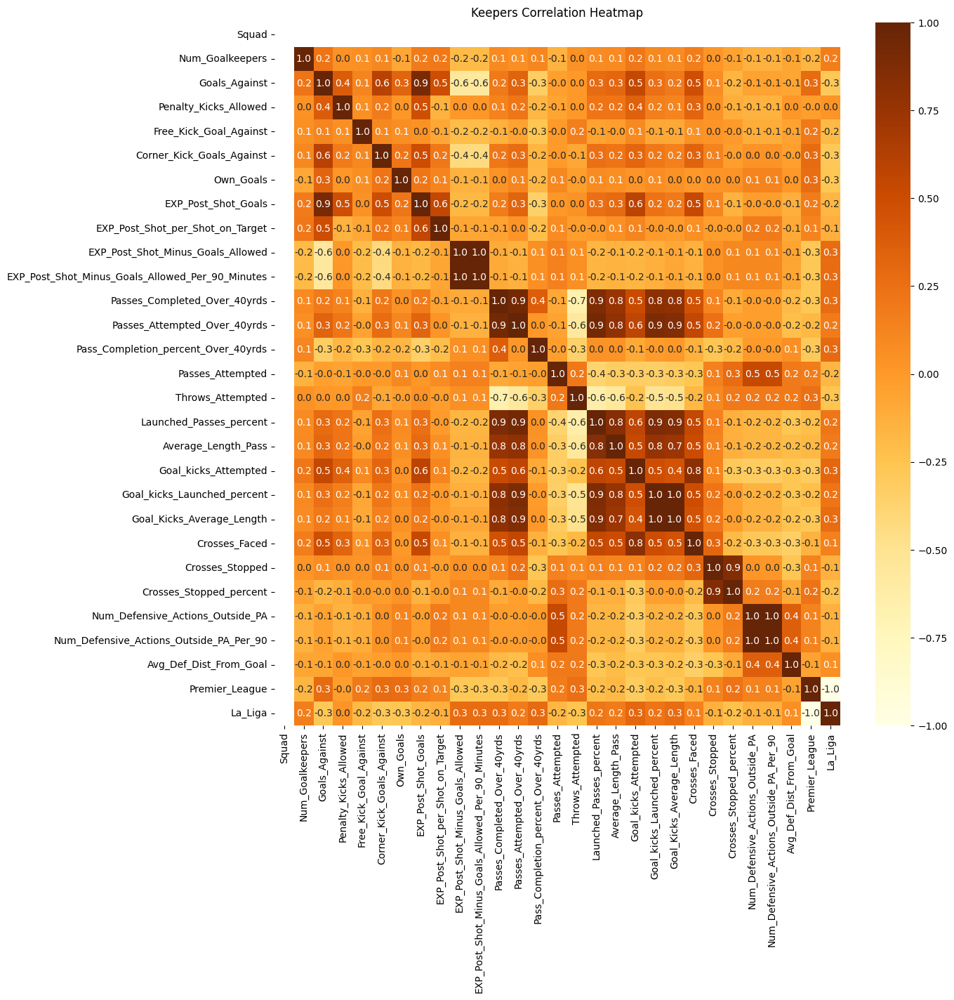

In [ ]:
#Plot Correlation matrix to help visualize and spot correlations between numeric variables
# https://seaborn.pydata.org/generated/seaborn.heatmap.html
plt.subplots(figsize=(13,13)) #has to be big so you can see the numbers
sns.heatmap(corr_matrix, annot=True, cmap='YlOrBr', fmt=".1f")
plt.title('Keepers Correlation Heatmap')
plt.show()

# Developing Regression models

In [ ]:
#Check for nans before moving forward:
numeric_df.isna().sum()
#The correlation matrix has negatives so can't be used

,0
Squad,120
Num_Goalkeepers,0
Goals_Against,0
Penalty_Kicks_Allowed,0
Free_Kick_Goal_Against,0
Corner_Kick_Goals_Against,0
Own_Goals,0
EXP_Post_Shot_Goals,0
EXP_Post_Shot_per_Shot_on_Target,0
EXP_Post_Shot_Minus_Goals_Allowed,0


                             OLS Regression Results                             
Dep. Variable:     Goal_kicks_Attempted   R-squared:                       0.355
Model:                              OLS   Adj. R-squared:                  0.338
Method:                   Least Squares   F-statistic:                     21.24
Date:                  Tue, 27 May 2025   Prob (F-statistic):           4.92e-11
Time:                          09:34:36   Log-Likelihood:                -596.14
No. Observations:                   120   AIC:                             1200.
Df Residuals:                       116   BIC:                             1211.
Df Model:                             3                                         
Covariance Type:              nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Interc

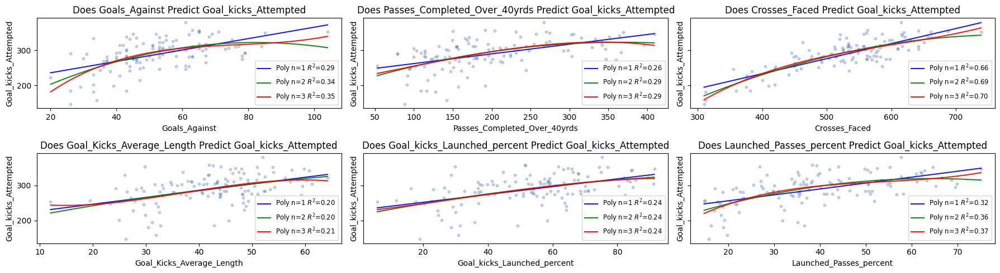

In [ ]:
#Re-designing function fit for report displaying purposes, titles, hiding summaries etc
def lin_poly_Regression(predictor, response_var):
    plt.scatter(predictor, response_var, s=10, alpha=0.3)
    plt.xlabel(predictor.name)
    plt.ylabel(response_var.name)

    x = pd.DataFrame({predictor.name : np.linspace(predictor.min(), predictor.max(), len(predictor)) })

    poly_1 = smf.ols(formula=f"{response_var.name} ~ 1 + {predictor.name}", data=numeric_df).fit()
    plt.plot(x, poly_1.predict(x), 'b-', label='Poly n=1 $R^2$=%.2f' % poly_1.rsquared,  alpha=0.9)

    poly_2 = smf.ols(formula=f"{response_var.name} ~ 1 + {predictor.name} + I({predictor.name} ** 2.0)", data=numeric_df).fit()
    plt.plot(x, poly_2.predict(x), 'g-', label='Poly n=2 $R^2$=%.2f' % poly_2.rsquared, alpha=0.9)

    poly_3 = smf.ols(formula=f"{response_var.name} ~ 1 + {predictor.name} + I({predictor.name} ** 2.0) + I({predictor.name} ** 3.0)", data=numeric_df).fit()
    plt.plot(x, poly_3.predict(x), 'r-', alpha=0.9,
            label='Poly n=3 $R^2$=%.2f' % poly_3.rsquared)

    plt.title(f"Does {predictor.name} Predict {response_var.name}")
    plt.legend(loc='lower right', frameon=True, fontsize='small')
    #residuals = poly_3.resid

    print(poly_3.summary()) #extra info if desired
# Developing
plt.style.use("seaborn-v0_8-deep") # !! might be different dependent on your version of matplotlib/seaborns !! Use: print(plt.style.available) to check !!

fig, axes = plt.subplots(2, 3, figsize=(18, 5), sharey=True)
predictors = [numeric_df['Goals_Against'],numeric_df['Passes_Completed_Over_40yrds'],numeric_df['Crosses_Faced'],numeric_df['Goal_Kicks_Average_Length'],numeric_df['Goal_kicks_Launched_percent'],numeric_df['Launched_Passes_percent']]

axes = axes.flatten()
for ax, pred in zip(axes, predictors): #for every axes and predictor in paired list
    plt.sca(ax) #with this current subplot
    lin_poly_Regression(pred, numeric_df['Goal_kicks_Attempted']) #call function

# Plot data
plt.tight_layout() # stops covering of axis labels
plt.show()


Try non-linear transformations: Apply transformations to your independent variables log(X),  


Now lets do the same for residuals to check the quality of fit

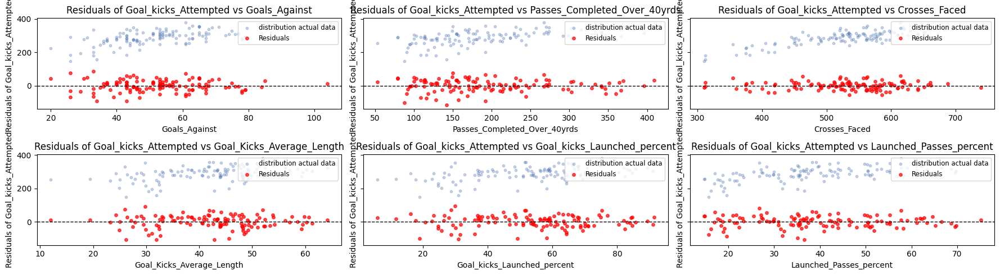

In [ ]:
def lin_poly_Residuals(predictor, response_var):
    plt.scatter(predictor, response_var, s=10, alpha=0.3, label='distribution actual data')
    plt.xlabel(predictor.name)
    plt.ylabel("Residuals of " + response_var.name)

    # Fit the cubic polynomial regression
    poly_3 = smf.ols(formula=f"{response_var.name} ~ 1 + {predictor.name} + I({predictor.name} ** 2.0) + I({predictor.name} ** 3.0)", data=numeric_df).fit()
    residuals = poly_3.resid
    plt.scatter(predictor, residuals, color='red', s=15, alpha=0.7, label='Residuals')

    plt.axhline(0, color='black', linestyle='--', linewidth=1)  # horizontal line at zero residual
    plt.title(f"Residuals of {response_var.name} vs {predictor.name}")
    plt.legend(loc='upper right', frameon=True, fontsize='small')

fig, axes = plt.subplots(2, 3, figsize=(18, 5), sharey=True)
predictors = [numeric_df['Goals_Against'], numeric_df['Passes_Completed_Over_40yrds'], numeric_df['Crosses_Faced'], numeric_df['Goal_Kicks_Average_Length'], numeric_df['Goal_kicks_Launched_percent'],numeric_df['Launched_Passes_percent']]

axes = axes.flatten()
for ax, pred in zip(axes, predictors):
    plt.sca(ax)
    lin_poly_Residuals(pred, numeric_df['Goal_kicks_Attempted'])

plt.tight_layout()
plt.show()



Goals_Against: generally scattered around 0, no visual trends<br>
Passes_Completed_Over_40yards: generally scattered around 0, no visual trends <br>
Crosses_Faced: Generally scattered around 0, no visual trends <br>
<br>
Goal_Kicks_Average_Length: Generally scattered around 0, maybe closer to 0 in outlier cases? Could see a curve coming in with more data (upside down U shape) <br>
<br>
Premier_League / La_Liga: Polynomial fitting categorical variables is a incorrect usecase, should just use logistic regression
<br>

Feature Scaling to Predict Goal Kicks Attempted

In [ ]:
numeric_df.describe()

,Squad,Num_Goalkeepers,Goals_Against,Penalty_Kicks_Allowed,Free_Kick_Goal_Against,Corner_Kick_Goals_Against,Own_Goals,EXP_Post_Shot_Goals,EXP_Post_Shot_per_Shot_on_Target,EXP_Post_Shot_Minus_Goals_Allowed,...,Goal_kicks_Launched_percent,Goal_Kicks_Average_Length,Crosses_Faced,Crosses_Stopped,Crosses_Stopped_percent,Num_Defensive_Actions_Outside_PA,Num_Defensive_Actions_Outside_PA_Per_90,Avg_Def_Dist_From_Goal,Premier_League,La_Liga
count,0.0,120.0,120.0,120.0,120.0,120.0,120.0,120.0,120.0,120.0,...,120.0,120.0,120.0,120.0,120.0,120.0,120.0,120.0,120.0,120.0
mean,<NA>,2.133333,52.6,4.3,0.65,6.441667,1.758333,49.643333,0.27875,-1.198333,...,53.244167,42.085833,529.325,31.516667,6.015833,45.666667,1.2015,14.030833,0.5,0.5
std,<NA>,0.685177,14.527517,2.217577,0.784835,3.304684,1.414189,11.841699,0.026618,5.829525,...,19.108328,10.166052,82.783728,10.487274,1.966227,16.527204,0.435075,3.505045,0.502096,0.502096
min,<NA>,1.0,20.0,0.0,0.0,0.0,0.0,24.1,0.22,-22.0,...,5.9,12.0,310.0,8.0,1.5,8.0,0.21,4.0,0.0,0.0
25%,<NA>,2.0,43.0,2.0,0.0,4.0,1.0,41.2,0.26,-4.325,...,37.775,34.25,487.0,24.0,4.675,35.5,0.935,12.375,0.0,0.0
50%,<NA>,2.0,53.0,4.0,0.5,6.0,2.0,49.45,0.28,-0.3,...,56.2,43.45,536.5,30.0,5.8,45.0,1.18,14.5,0.5,0.5
75%,<NA>,2.0,62.25,6.0,1.0,8.0,3.0,56.925,0.2925,2.225,...,66.225,48.65,582.25,37.25,7.2,54.0,1.42,16.1,1.0,1.0
max,<NA>,4.0,104.0,11.0,4.0,16.0,7.0,85.1,0.35,9.4,...,91.4,64.2,739.0,65.0,12.8,100.0,2.63,23.7,1.0,1.0


Since Our data is small (120 data points) we can use the content from week 11 to calibrate our model.

In [ ]:
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score, cross_validate, StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.calibration import CalibratedClassifierCV, calibration_curve
from sklearn.metrics import roc_auc_score, brier_score_loss, roc_curve
from imblearn.over_sampling import SMOTE
from sklearn.metrics import classification_report
from sklearn.naive_bayes import GaussianNB

In [ ]:
numeric_df['La_Liga'].value_counts()

,count
La_Liga,
1,60
0,60


The data is balanced in terms of English Premier League vs La Liga. Both leagues are evenly represented.

In [ ]:
df = numeric_df[['Goal_kicks_Attempted','Goals_Against', 'Passes_Completed_Over_40yrds', 'Crosses_Faced', 'Goal_kicks_Launched_percent','Launched_Passes_percent','La_Liga']]


Let's try Naive Bayes to predict League

In [ ]:
nb = GaussianNB()
X = df[['Goals_Against', 'Passes_Completed_Over_40yrds', 'Crosses_Faced',
        'Goal_kicks_Launched_percent','Launched_Passes_percent']]
y = df.La_Liga
#Naive Bayes
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=10, test_size=0.5, stratify=y)
#stratify makes sure distribution between train and test is the same
nb.fit(X_train, y_train)
print('NB', classification_report(y_test, nb.predict(X_test)) )

NB               precision    recall  f1-score   support

         0.0       0.69      0.67      0.68        30
         1.0       0.68      0.70      0.69        30

    accuracy                           0.68        60
   macro avg       0.68      0.68      0.68        60
weighted avg       0.68      0.68      0.68        60



Test split performance: <br>
Each class has a sample of 30, f1 score is 0.68, Precision and recall are the same (negligible difference) which indicates to me it's not favouring either class, which is good!

In [ ]:
print('NB', classification_report(y, nb.predict(X)) )

NB               precision    recall  f1-score   support

         0.0       0.69      0.58      0.63        60
         1.0       0.64      0.73      0.68        60

    accuracy                           0.66       120
   macro avg       0.66      0.66      0.66       120
weighted avg       0.66      0.66      0.66       120



Actual Data Performance: <br>
f1 score drops, this indicates to me the training data is overfitted (performs better on the trained data than real observations)

We can try using kFold-CrossValidation for a more robust/reliable evaluation:

In [ ]:
cv = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)
nb = GaussianNB()

cv_results = cross_validate(
    estimator=nb,
    X=X,
    y=y,
    cv=cv,
    scoring=['accuracy', 'precision_macro', 'recall_macro', 'f1_macro'],
    return_train_score=True
)

for metric in ['train_accuracy', 'test_accuracy', 'test_precision_macro', 'test_recall_macro', 'test_f1_macro']:
    scores = cv_results[metric]
    print(f"{metric}: Mean = {scores.mean():.4f}, Std = {scores.std():.4f}")


train_accuracy: Mean = 0.6958, Std = 0.0118
test_accuracy: Mean = 0.6000, Std = 0.0612
test_precision_macro: Mean = 0.6046, Std = 0.0601
test_recall_macro: Mean = 0.6000, Std = 0.0612
test_f1_macro: Mean = 0.5919, Std = 0.0673


kF-CV Performance: <br>
Training f1 score slightly increases: 0.7 compared to 0.69 for non k-Fold. <br>
Test accuracy small decrease: 0.6 compared to 0.63 for non k-Fold. <br> This indicates the single split might have been overfitting. Shows stability. Not that sensitive to different data splits. Real world performance is probably closer to 60%

Let's visualise the data to see ...

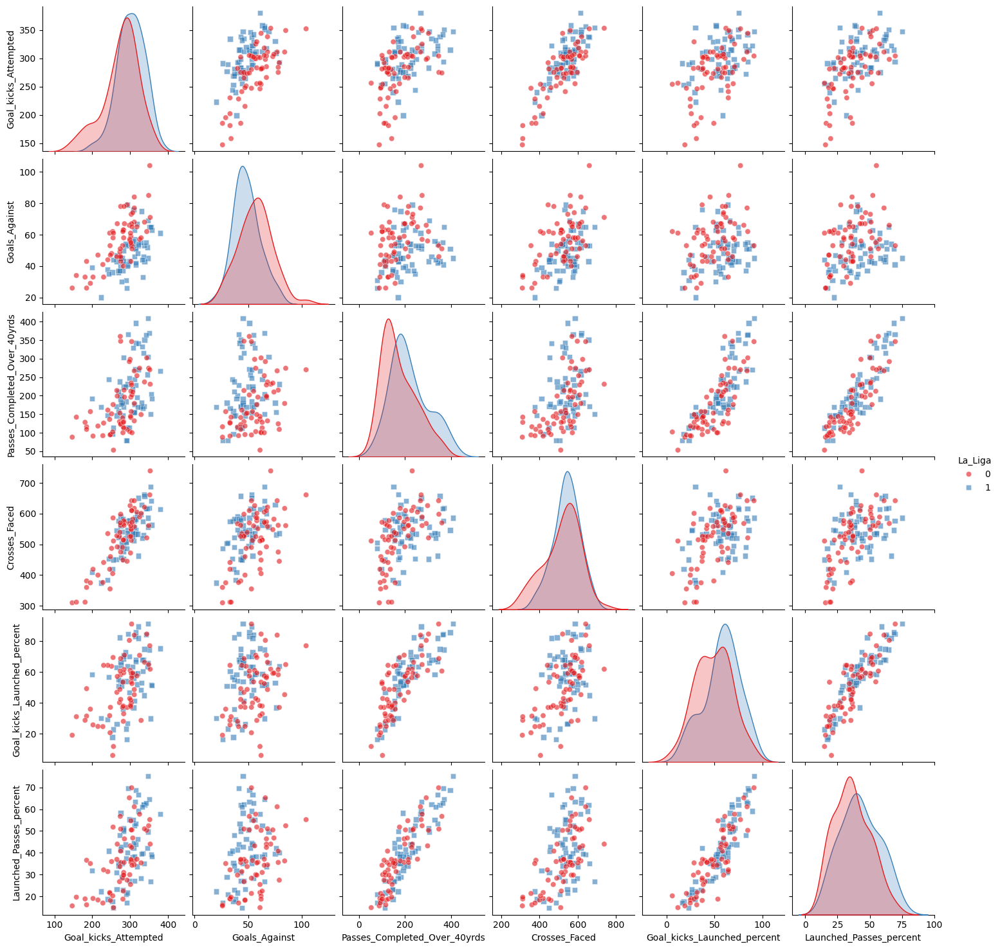

In [ ]:
sns.pairplot(df, hue='La_Liga', diag_kind='kde', palette='Set1', corner=False, plot_kws={'alpha': 0.6}, markers=["o","s"])
plt.show()

Check our calibration

In [ ]:
nb.fit(X, y)

GaussianNB()

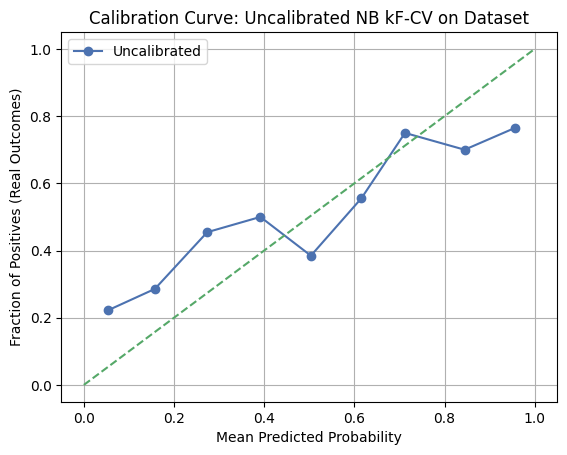

In [ ]:
X_proba = nb.predict_proba(X)[:, 1]
prob_true_uncal, prob_pred_uncal = calibration_curve(y, X_proba, n_bins=9)
plt.figure()
plt.plot(prob_pred_uncal, prob_true_uncal, marker='o', label='Uncalibrated')
plt.plot([0, 1], [0, 1], linestyle='--')
plt.xlabel('Mean Predicted Probability')
plt.ylabel('Fraction of Positives (Real Outcomes)')
plt.title('Calibration Curve: Uncalibrated NB kF-CV on Dataset')
plt.legend()
plt.grid()
plt.show()

The Naive Bayes classifier using k-Fold Cross Validation for under 0.4 predicted probabilities is over predicting (predicts more than the real values). Then under predicting for probabilities around 0.5 and 0.8 (predicts less than the real values).

Let's Calibrate!

In [ ]:
nb.fit(X, y)

GaussianNB()

Distribution of Probabilities of Naive Bayes before Platt Scaling: <br>
Shows overfitting in outer bounds (0 and 1) although still decently distributed <br>


Text(0.5, 1.0, 'NB kF-CV Distribution of Proabilities')

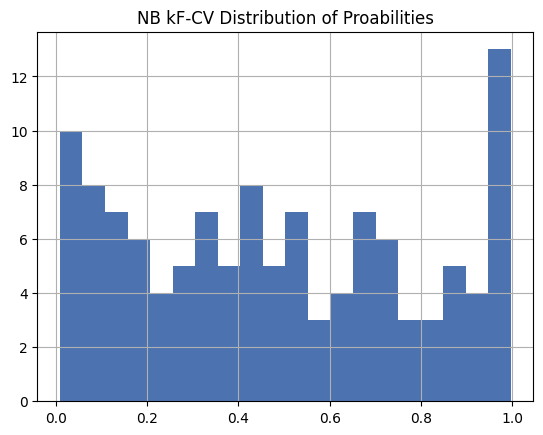

In [ ]:
X_proba = nb.predict_proba(X)[:, 1]
pd.DataFrame(X_proba).hist(bins=20)
plt.title("NB kF-CV Distribution of Proabilities")

array([[<Axes: title={'center': '0'}>]], dtype=object)

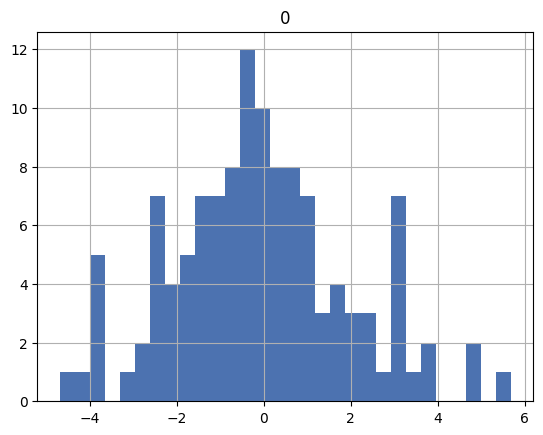

In [ ]:
log_odds = nb.predict_log_proba(X)[:, 1] - nb.predict_log_proba(X)[:, 0]
log_odds
pd.DataFrame(log_odds).hist(bins=30)

Histogram of Log Odds shows no skews, indicating there is a more even chance of it being either La Liga or Premier League given any datapoint.

Perform logistic regression on the log odds:

In [ ]:
platt = LogisticRegression(solver='lbfgs')
platt.fit(log_odds.reshape(-1, 1), y)

LogisticRegression()

Use platt scaling to calibrate the predicted probabilities of the model

In [ ]:
calibrated_proba = platt.predict_proba(log_odds.reshape(-1, 1))[:, 1]

Visualise our platt scaled probabilities (calibrated)

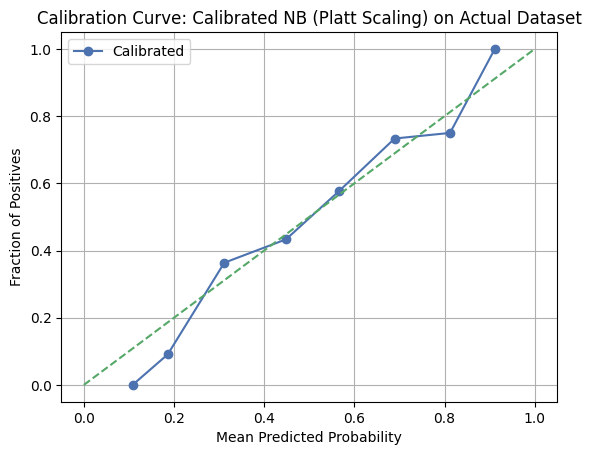

In [ ]:
prob_true_cal, prob_pred_cal = calibration_curve(y, calibrated_proba, n_bins=8)
plt.figure()
plt.plot(prob_pred_cal, prob_true_cal, marker='o', label='Calibrated')
plt.plot([0, 1], [0, 1], linestyle='--')
plt.xlabel('Mean Predicted Probability')
plt.ylabel('Fraction of Positives')
plt.title('Calibration Curve: Calibrated NB (Platt Scaling) on Actual Dataset')
plt.legend()
plt.grid()
plt.show()


Calibration curve shows how well probabilities aligned with true frequencies<br>
Platt scaling has really helped here in making our model predictions reflect the true outcomes

Text(0.5, 1.0, 'NB kF-CV Distribution of Probabilities With Platt Scaler')

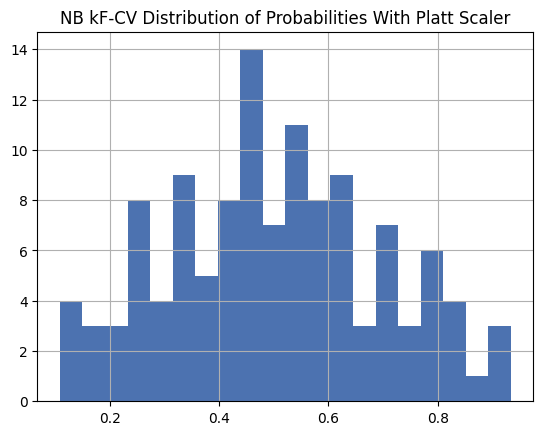

In [ ]:
pd.DataFrame(calibrated_proba).hist(bins=20)
plt.title("NB kF-CV Distribution of Probabilities With Platt Scaler")

the use of platt scaling has; <br>
flattened the probabilities compared to log odds (a value of 0.7 truly means 70%) <br>
squashed the range between 0 and 1 <br>
Corrected the over confidence, the original log odds <br>
<br>
This illustrates calibration creating more truly reliable probability estimates compared to raw Naive Bayes

In [ ]:
print(classification_report(y, (platt.predict_proba(
                                    (nb.predict_log_proba(X)[:, 1] - nb.predict_log_proba(X)[:, 0]).reshape(-1, 1)
                                            )[:, 1] >= 0.5).astype(int)))

              precision    recall  f1-score   support

         0.0       0.66      0.70      0.68        60
         1.0       0.68      0.63      0.66        60

    accuracy                           0.67       120
   macro avg       0.67      0.67      0.67       120
weighted avg       0.67      0.67      0.67       120



Classification report shows how well these calibrated probabilities translate to correct predictions of class 0 and 1

In [ ]:
proba_uncal = nb.predict_proba(X)[:,1]
proba_calib = calibrated_proba
print("Brier score (uncalibrated): ", brier_score_loss(y, proba_uncal))
print("Brier score (calibrated): ", brier_score_loss(y, proba_calib))

Brier score (uncalibrated):  0.22664917882991348
Brier score (calibrated):  0.21162068022612568


Brier score is high! 0.25 would be 50% random checks so our classification works slightly better than random prediction. To reduce our Brier score we could use a different model.

## KNN

Weighted vs unifrom aggregation styles

In [ ]:
df = numeric_df

In [ ]:
X = numeric_df.Crosses_Faced.values
X = np.reshape(X, (len(numeric_df.Crosses_Faced), 1))
y = numeric_df.Goal_kicks_Attempted.values
y = np.reshape(y, (len(numeric_df.Goal_kicks_Attempted), 1))


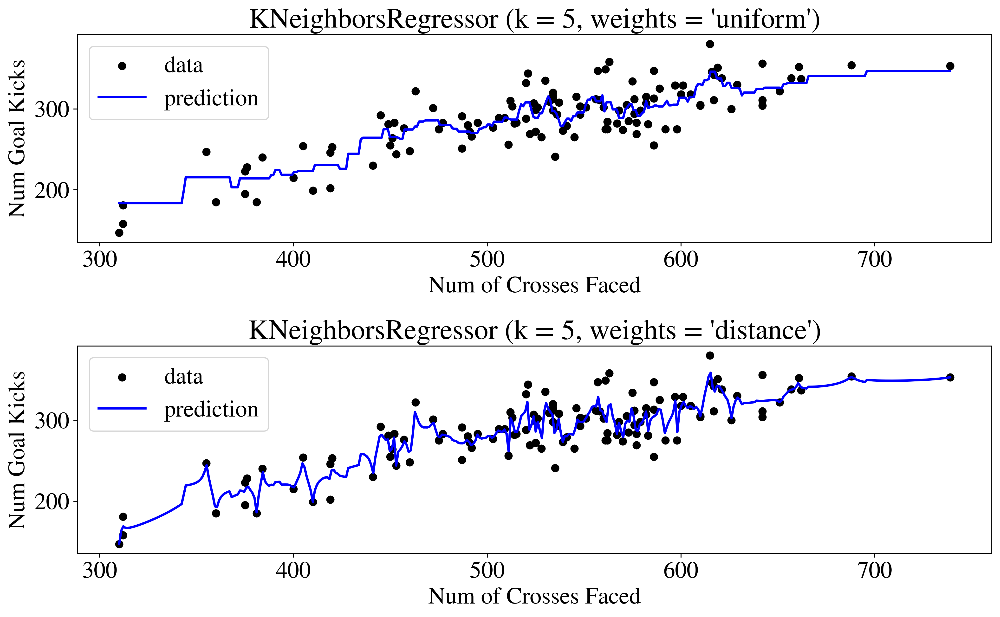

In [ ]:
from sklearn import neighbors
rcParams['figure.figsize'] = 14, 8
rcParams['font.size'] = 20
rcParams['figure.dpi'] = 350
rcParams['lines.linewidth'] = 2
rcParams['axes.facecolor'] = 'white'
rcParams['patch.edgecolor'] = 'white'
rcParams['font.family'] = 'StixGeneral'# Fit regression model
x = np.linspace(X.min(), X.max(), 400).reshape(-1, 1)
n_neighbors = 5

for i, weights in enumerate(['uniform', 'distance']):
    knn = neighbors.KNeighborsRegressor(n_neighbors, weights=weights)
    y_hat = knn.fit(X, y).predict(x)

    plt.subplot(2, 1, i + 1)
    plt.scatter(X, y, c='k', label='data')
    plt.plot(x, y_hat, c='b', label='prediction')
    plt.axis('tight')
    plt.xlabel('Num of Crosses Faced')
    plt.ylabel('Num Goal Kicks')
    plt.legend(loc='upper left')
    plt.title("KNeighborsRegressor (k = %i, weights = '%s')" % (n_neighbors, weights))
    plt.subplots_adjust( hspace=0.5)

plt.show()


Uniform is showing less noise, maybe playing with the scale of weight code help

Lets check the how well the models are fitting:

In [ ]:
def calculate_regression_goodness_of_fit(ys, y_hat):
    ss_total = 0
    ss_residual = 0
    ss_regression = 0
    y_mean = y.mean()

    for i in range(len(ys)):
        ss_total += np.square(ys[i] - y_mean)
        ss_residual += np.square(ys[i] - y_hat[i])
        ss_regression += np.square(y_hat[i] - y_mean)

    r_square = ss_regression / ss_total
    rmse = np.sqrt( ss_residual / float(len(ys)) )

    return r_square[0], rmse[0]



In [ ]:
rsquare_arr = []
rmse_arr = []

for k in range(2, len(y)):
    knn = neighbors.KNeighborsRegressor(n_neighbors=k)
    y_hat = knn.fit(X, y).predict(X)
    rsquare, rmse = calculate_regression_goodness_of_fit(y, y_hat)
    rmse_arr.append(rmse)
    rsquare_arr.append(rsquare)

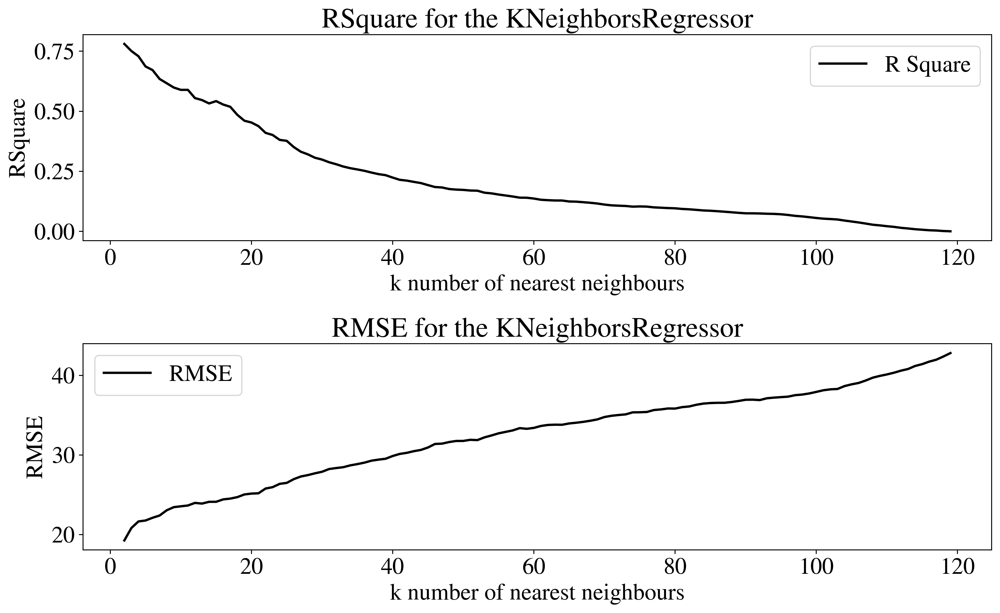

In [ ]:
plt.subplot(2, 1, 1)
plt.plot(range(2, len(y)), rsquare_arr, c='k', label='R Square')
plt.axis('tight')
plt.xlabel('k number of nearest neighbours')
plt.ylabel('RSquare')
plt.legend(loc='upper right')
plt.title("RSquare for the KNeighborsRegressor")
plt.subplots_adjust( hspace=0.5)

plt.subplot(2, 1, 2)
plt.plot(range(2, len(y)), rmse_arr, c='k', label='RMSE')
plt.axis('tight')
plt.xlabel('k number of nearest neighbours')
plt.ylabel('RMSE')
plt.legend(loc='upper left')
plt.title("RMSE for the KNeighborsRegressor")
plt.show()
#as k increases r^2 decreases (toward the mean)

RSquare coefficient of determination shows best performing number of neighbours to consider. (higher is better) <br><br>
Root mean squared error is supposed to go up when number of neighbours increases. So RMSE is underfitting? Too much noise, not enough data? - KNN is sensitive to noise. Not sure what happened but now it is working?? (lower is better)

In [ ]:
np.var(y)

np.float64(1873.5999305555556)

Next I will attempt Naive Bayes Classifier

We already have a class column (1 is La Liga, 0 is English Premier)

In [ ]:
df.La_Liga.unique()

<IntegerArray>
[1, 0]
Length: 2, dtype: Int64

Priors

In [ ]:
def calculate_class_statistics(df, class_label):
    class_distr = {}
    feature_types = []
    feature_types =  df.columns[1:]
    means = (df[feature_types][df.La_Liga == class_label]).mean()
    stds = (df[feature_types][df.La_Liga == class_label]).std()
    #YOUR CODE HERE
    for feature in feature_types:
        class_distr[feature] = []
        class_distr[feature].append(means[feature])
        class_distr[feature].append(stds[feature])
    return class_distr

In [ ]:
def train_naive_bayes(df):
    NB_classifier = {}
    class_labels = df.La_Liga.unique()
    for i in class_labels:
        likelihood_prior = calculate_class_statistics(df,i)
        likelihood_prior['Prior'] = float(df.La_Liga[df.La_Liga == i].count()) / float(df.La_Liga.count())
        NB_classifier[str(i)] = likelihood_prior
    return NB_classifier

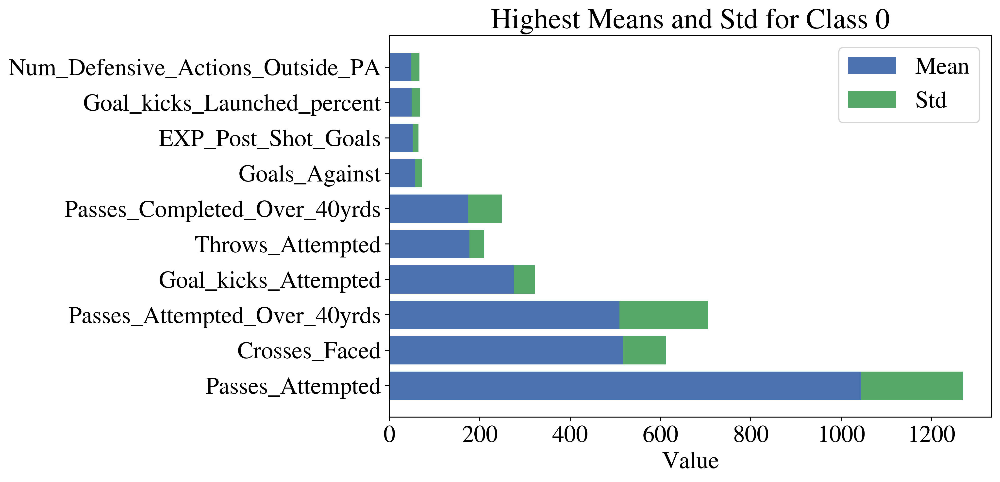

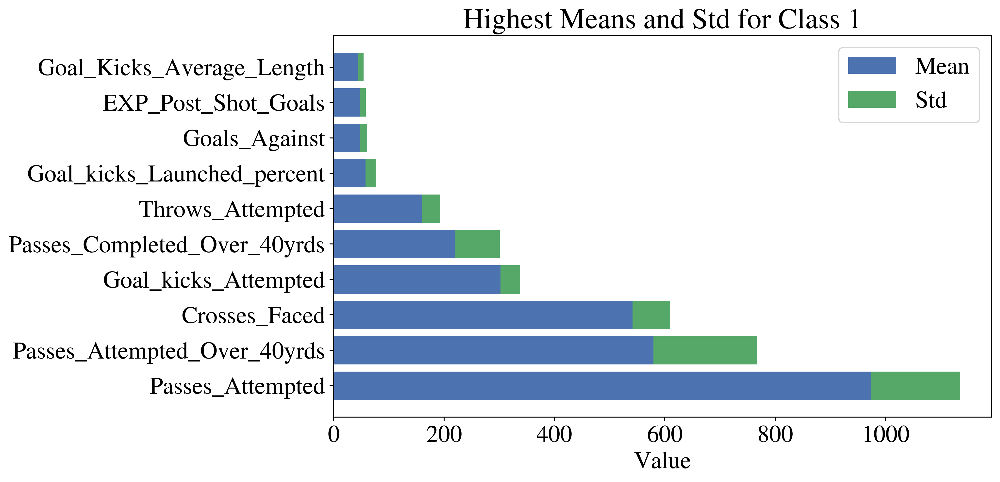

In [ ]:
def plot_top_features_for_class(NB_classifier, class_label):
    data = NB_classifier[str(class_label)]

    max_values = {}
    for feature, values in data.items():
        if feature != 'Prior':  # skip prior probability in output graphs
            max_values[feature] = max(values)

    labels = sorted(max_values, key=max_values.get, reverse=True)[:10] #slice top 10
    means = [data[label][0] for label in labels]  # mean values
    stds = [data[label][1] for label in labels]   # std values

    y = np.arange(len(labels))
    plt.figure(figsize=(12, 6))
    plt.barh(y, means, label='Mean')
    plt.barh(y, stds, left=means, label='Std')
    plt.yticks(y, labels)
    plt.xlabel('Value')
    plt.title(f'Highest Means and Std for Class {class_label}')
    plt.legend()
    plt.tight_layout()
    plt.show()

NB_classifier = train_naive_bayes(df)
plot_top_features_for_class(NB_classifier, class_label=0) # 0 is english prem since it is La_Liga Column
plot_top_features_for_class(NB_classifier, class_label=1) #1 is La Liga


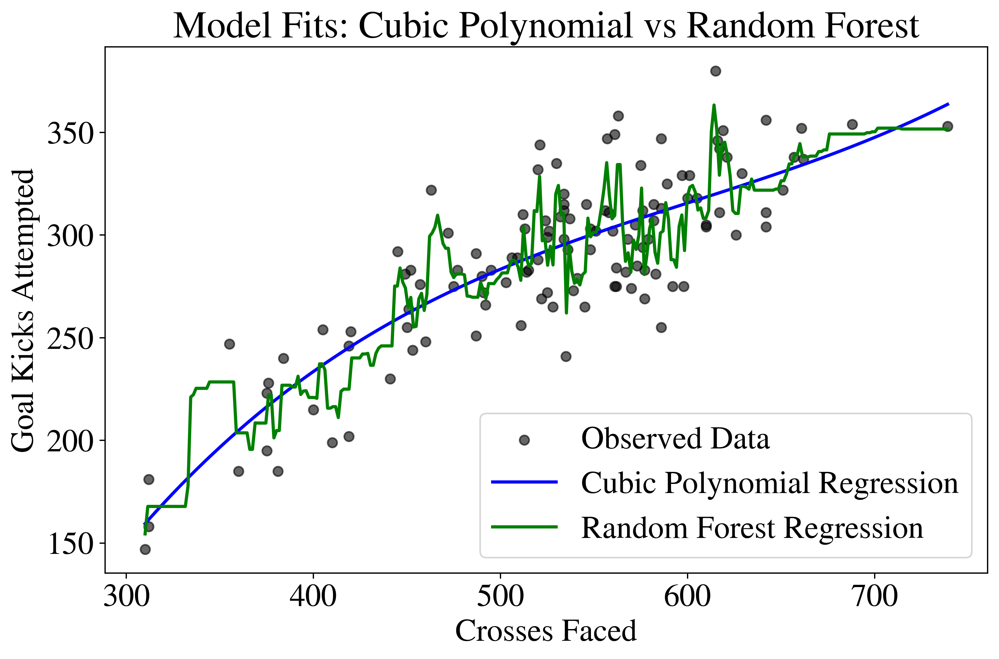

In [ ]:
#https://www.datacamp.com/tutorial/random-forests-classifier-python
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor

X = df[['Crosses_Faced']].values
y = df['Goal_kicks_Attempted'].values

X_plot = np.linspace(X.min(), X.max(), 300).reshape(-1, 1)

poly_model = make_pipeline(PolynomialFeatures(degree=3), LinearRegression())
poly_model.fit(X, y)
y_poly_pred = poly_model.predict(X_plot)

rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X, y)
y_rf_pred = rf_model.predict(X_plot)

plt.figure(figsize=(10, 6))
plt.scatter(X, y, color='black', alpha=0.6, label='Observed Data')
plt.plot(X_plot, y_poly_pred, color='blue', linewidth=2, label='Cubic Polynomial Regression')
plt.plot(X_plot, y_rf_pred, color='green', linewidth=2, label='Random Forest Regression')
plt.xlabel('Crosses Faced')
plt.ylabel('Goal Kicks Attempted')
plt.title('Model Fits: Cubic Polynomial vs Random Forest')
plt.legend()
plt.show()


In [ ]:
# Data Processing
import pandas as pd
import numpy as np
# Modelling
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, ConfusionMatrixDisplay
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from scipy.stats import randint

# Tree Visualisation
from sklearn.tree import export_graphviz
from IPython.display import Image
#import graphviz

In [ ]:
# Split the data into features (X) and target (y)
X = numeric_df.drop('Goal_kicks_Attempted', axis=1)
y = numeric_df['Goal_kicks_Attempted']

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

In [ ]:
rf = RandomForestClassifier()
rf.fit(X_train, y_train)

RandomForestClassifier()

In [ ]:
y_pred = rf.predict(X_test)

In [ ]:
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.0


# Daniel Shippey ID:04175484 Shooting

In [ ]:
#----------------------------------------
#Daniel Shippey ID:04175484   (referenced other members code and my own from A1 and A2)

# Load data for passing_combined
shooting_combined = pd.read_csv("shooting_combined.csv")

# Initial inspection
print(shooting_combined.shape)
print(shooting_combined.columns)
print(shooting_combined.head())
print(shooting_combined.dtypes)
print(shooting_combined.isnull().sum())

# Convert numeric columns (if needed)
numeric_cols = shooting_combined.columns.drop(['Squad', 'League', 'Season'])
shooting_combined[numeric_cols] = shooting_combined[numeric_cols].apply(pd.to_numeric, errors='coerce')

# Descriptive statistics
print(shooting_combined.describe())

(120, 22)
Index(['Squad', '# Pl', '90s', 'Gls', 'Sh', 'SoT', 'SoT%', 'Sh/90', 'SoT/90',
       'G/Sh', 'G/SoT', 'Dist', 'FK', 'PK', 'PKatt', 'xG', 'npxG', 'npxG/Sh',
       'G-xG', 'np:G-xG', 'League', 'Season'],
      dtype='object')
             Squad  # Pl   90s  Gls   Sh  SoT  SoT%  Sh/90  SoT/90  G/Sh  ...  \
0           Alavés    33  38.0   29  373  111  29.8   9.82    2.92  0.06  ...   
1    Athletic Club    26  38.0   40  460  150  32.6  12.11    3.95  0.08  ...   
2  Atlético Madrid    26  38.0   63  458  152  33.2  12.05    4.00  0.13  ...   
3        Barcelona    38  38.0   68  511  177  34.6  13.45    4.66  0.12  ...   
4            Betis    31  38.0   60  509  182  35.8  13.39    4.79  0.11  ...   

   FK  PK  PKatt    xG  npxG  npxG/Sh  G-xG  np:G-xG   League     Season  
0  15   6      7  37.3  31.8     0.09  -8.3     -8.8  La Liga  2021-2022  
1  11   3      7  49.6  44.0     0.10  -9.6     -7.0  La Liga  2021-2022  
2   8   4      5  54.4  50.6     0.11   8.6      8.4 

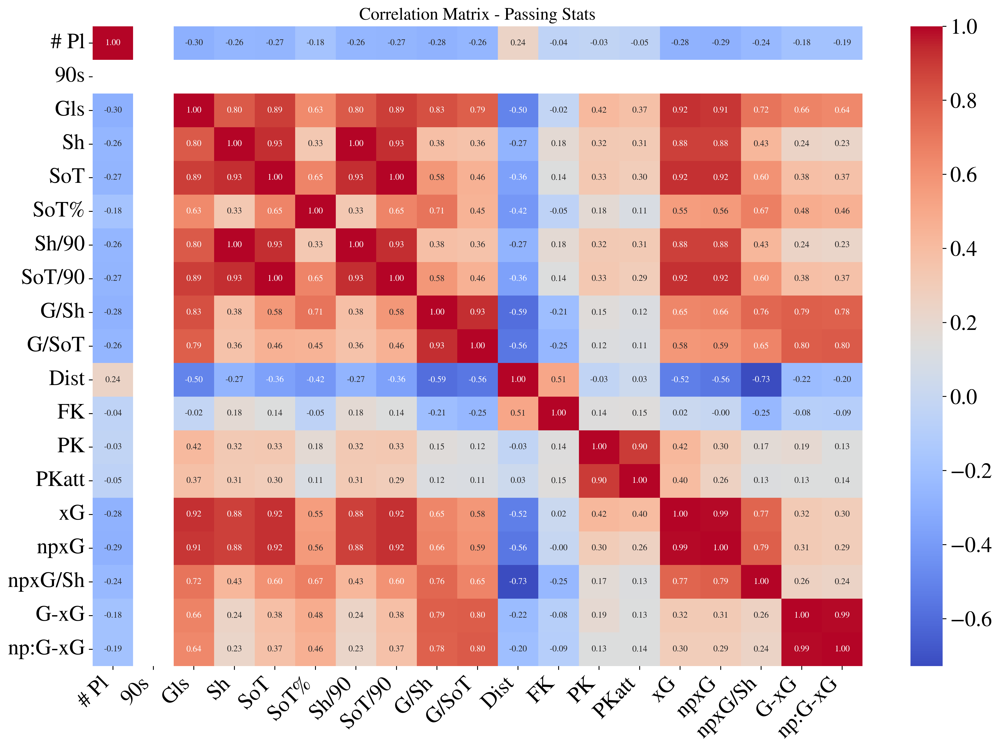

In [ ]:
# Correlation matrix
plt.figure(figsize=(14, 10))
corr_matrix = shooting_combined.corr(numeric_only=True)

sns.heatmap(
    corr_matrix,
    cmap='coolwarm',
    annot=True,
    fmt=".2f",
    annot_kws={"size": 8}
)

plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.title("Correlation Matrix - Passing Stats", fontsize=16)
plt.tight_layout()
plt.show()

In [ ]:
#add league dummy variables to shooting data

shooting_combined['Premier League'] = shooting_combined['League'].map({'La Liga': 0, 'Premier League': 1})
shooting_combined['La Liga'] = shooting_combined['League'].map({'La Liga': 1, 'Premier League': 0})
shooting_combined.rename(columns={'Premier League': 'Premier_League', 'La Liga': 'La_Liga'}, inplace=True)

In [ ]:
#add season dummy variables

shooting_combined['Season1'] = shooting_combined['Season'].map({'2021-2022': 1, '2022-2023': 0,'2023-2024': 0})
shooting_combined['Season2'] = shooting_combined['Season'].map({'2022-2023': 1, '2021-2022': 0,'2023-2024': 0})
shooting_combined['Season3'] = shooting_combined['Season'].map({'2023-2024': 1, '2022-2023': 0,'2021-2022': 0})

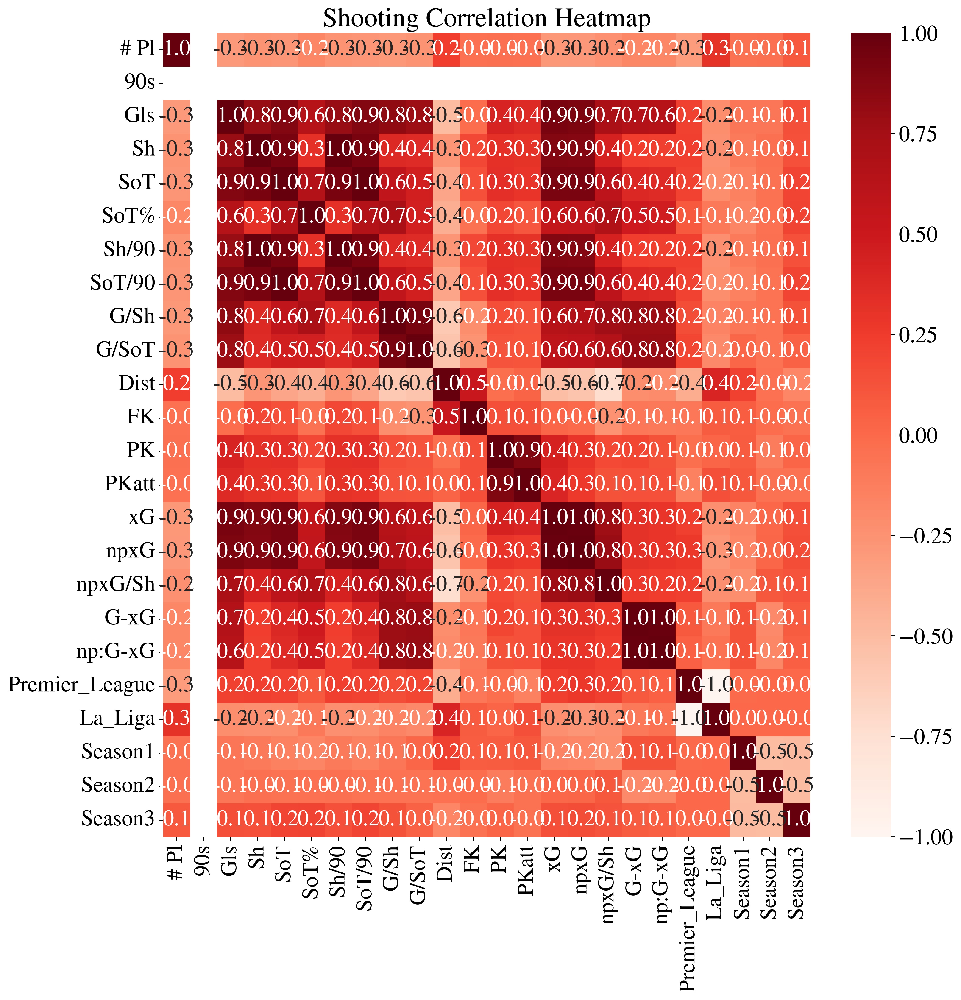

In [ ]:
#create correlation matrix
corr_matrix = shooting_combined.corr(numeric_only=True)

#Plot Correlation matrix heatmap
# https://seaborn.pydata.org/generated/seaborn.heatmap.html
plt.subplots(figsize=(13,13))
sns.heatmap(corr_matrix, annot=True, cmap='Reds', fmt=".1f") #https://python-graph-gallery.com/92-control-color-in-seaborn-heatmaps/
plt.title('Shooting Correlation Heatmap')
plt.show()

In [ ]:
# predict Goals
m1 = smf.ols(formula= 'Gls~1+Sh+SoT+Dist', data=shooting_combined).fit()  #note alot of the variables are likely explaining the same variation
#so I am limiting variables used
m1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    Gls   R-squared:                       0.823
Model:                            OLS   Adj. R-squared:                  0.819
Method:                 Least Squares   F-statistic:                     180.1
Date:                Tue, 27 May 2025   Prob (F-statistic):           1.76e-43
Time:                        09:34:56   Log-Likelihood:                -405.44
No. Observations:                 120   AIC:                             818.9
Df Residuals:                     116   BIC:                             830.0
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     45.1326     12.771      3.534      0.001      19.837      70.428
Sh            -0.0145      0.022     -0.660      0.511      -0.058       0.029
SoT            0.4281      0.054      7.926      0.000       0.321       0.535
Dist          -3.1281      0.655     -4.779      0.000      -4.425      -1.832
==============================================================================
Omnibus:                        1.184   Durbin-Watson:                   1.978
Prob(Omnibus):                  0.553   Jarque-Bera (JB):                0.739
Skew:                           0.139   Prob(JB):                        0.691
Kurtosis:                       3.266   Cond. No.                     9.84e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 9.84e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

--------------
From the above we can see Sot(shots on target) and Dist (distance from goal for shots) are significant at the 5% level
Durbin Watson is close to 2, Omnibus and JB are over 5% so assumptions look good.


In [ ]:
m2 = smf.ols(formula= 'Gls~1+SoT+Dist', data=shooting_combined).fit()  #remove shots

m2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    Gls   R-squared:                       0.823
Model:                            OLS   Adj. R-squared:                  0.820
Method:                 Least Squares   F-statistic:                     271.2
Date:                Tue, 27 May 2025   Prob (F-statistic):           1.17e-44
Time:                        09:34:56   Log-Likelihood:                -405.66
No. Observations:                 120   AIC:                             817.3
Df Residuals:                     117   BIC:                             825.7
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     44.9619     12.738      3.530      0.001      19.735      70.189
SoT            0.3951      0.020     19.351      0.000       0.355       0.436
Dist          -3.2134      0.640     -5.020      0.000      -4.481      -1.946
==============================================================================
Omnibus:                        1.109   Durbin-Watson:                   1.987
Prob(Omnibus):                  0.574   Jarque-Bera (JB):                0.666
Skew:                           0.119   Prob(JB):                        0.717
Kurtosis:                       3.276   Cond. No.                     3.14e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.14e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

-------------
removing shots did not chane the amount of variation explain (82%) or the assumptions. This is the best model for predicting Gls

In [ ]:
#predict shots
m3 = smf.ols(formula= 'Sh~1+Gls+Dist', data=shooting_combined).fit()

m3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                     Sh   R-squared:                       0.661
Model:                            OLS   Adj. R-squared:                  0.655
Method:                 Least Squares   F-statistic:                     114.0
Date:                Tue, 27 May 2025   Prob (F-statistic):           3.31e-28
Time:                        09:34:56   Log-Likelihood:                -634.78
No. Observations:                 120   AIC:                             1276.
Df Residuals:                     117   BIC:                             1284.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     19.2539     90.421      0.213      0.832    -159.821     198.328
Gls            4.3373      0.304     14.248      0.000       3.734       4.940
Dist          13.3574      4.660      2.866      0.005       4.128      22.586
==============================================================================
Omnibus:                        6.604   Durbin-Watson:                   1.977
Prob(Omnibus):                  0.037   Jarque-Bera (JB):                6.620
Skew:                           0.414   Prob(JB):                       0.0365
Kurtosis:                       3.800   Cond. No.                     1.14e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.14e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

--------------------------
We Can see from above that we can predict Number of Shots taken reasonably well from goals and total distance of shots (explains about 63% of variation)

In [ ]:
#knn regression #from my a2 - references geeksforgeeks tutorial https://www.geeksforgeeks.org/k-nearest-neighbors-knn-regression-with-scikit-learn/
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression

def adjust(mse):
    return np.sqrt(mse)

rsme=[]
listr2=[]

for i in range(10):


    X = shooting_combined[['SoT', 'Dist']]
    y = shooting_combined['Gls']

    # Split the dataset into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=i)

    # Standardise
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_test = scaler.transform(X_test)

    # Create and train the KNN regression model
    knn_regressor = KNeighborsRegressor(n_neighbors=2)
    knn_regressor.fit(X_train, y_train)

    # Make predictions on the test data
    y_pred = knn_regressor.predict(X_test)

    # Evaluate model
    mse = mean_squared_error(y_test, y_pred)
    r=adjust(mse)
    r2 = r2_score(y_test, y_pred)

    rsme.append(r)
    listr2.append(r2)

In [ ]:
sum(rsme)/10

np.float64(9.095767268138655)

In [ ]:
sum(listr2)/10

0.7011910068825191

In [ ]:
#implement linear regression with training and test split to compare to knn regression (based on same reference as knn regression above)
rsme=[]
listr2=[]

for i in range(10):

    X = shooting_combined[['SoT', 'Dist']]
    y = shooting_combined['Gls']

    # Split the dataset into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=i)

    model = LinearRegression()
    model.fit(X_train,y_train)

    # Make predictions on the test data
    y_pred = model.predict(X_test)

    # Evaluate model
    mse = mean_squared_error(y_test, y_pred)
    r=adjust(mse)
    r2 = r2_score(y_test, y_pred)

    rsme.append(r)
    listr2.append(r2)

In [ ]:
sum(rsme)/10

np.float64(7.22468055257105)

In [ ]:
sum(listr2)/10

0.812765572473697

------------------------
From the above we can see that the rsme for the linear regression model is lower and the r2 is higher indicating it is better than its
    knn equivalent

In [ ]:
#classify league
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics


#references:https://www.geeksforgeeks.org/ml-implementation-of-knn-classifier-using-sklearn/       https://www.kaggle.com/code/kadriyeaksakal/confusion-matrix-with-knn-algorithm

X = shooting_combined[['Gls', 'SoT', 'Dist']]
y = shooting_combined['Premier_League']

# normalisation
X = (X - np.min(X))/(np.max(X)-np.min(X))

training = []
test = []

for i in range(10):


    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = i)

    cl = KNeighborsClassifier(n_neighbors = 2)
    cl.fit(X_train, y_train)

    training_score = cl.score(X_train, y_train)
    test_score = cl.score(X_test, y_test)

    training.append(training_score)
    test.append(test_score)

In [ ]:
sum(training)/10

0.7642857142857142

In [ ]:
sum(test)/10

0.5083333333333333

-------------
Can see that the using gls sot and dist we get a model with 76% accuracy on its own training data
This falls to 50% on the test data

# Hibba

In [ ]:
# Load data for passing_combined
passing_combined = pd.read_csv("passing_combined.csv")

# Initial inspection
print(passing_combined.shape)
print(passing_combined.columns)
print(passing_combined.head())
print(passing_combined.dtypes)
print(passing_combined.isnull().sum())

# Convert numeric columns (if needed)
numeric_cols = passing_combined.columns.drop(['Squad', 'League', 'Season'])
passing_combined[numeric_cols] = passing_combined[numeric_cols].apply(pd.to_numeric, errors='coerce')

# Descriptive statistics
print(passing_combined.describe())

(120, 28)
Index(['Squad', '# Pl', '90s', 'Cmp', 'Att', 'Cmp%', 'TotDist', 'PrgDist',
       'Cmp.1', 'Att.1', 'Cmp%.1', 'Cmp.2', 'Att.2', 'Cmp%.2', 'Cmp.3',
       'Att.3', 'Cmp%.3', 'Ast', 'xAG', 'xA', 'A-xAG', 'KP', '1/3', 'PPA',
       'CrsPA', 'PrgP', 'League', 'Season'],
      dtype='object')
             Squad  # Pl   90s    Cmp    Att  Cmp%  TotDist  PrgDist  Cmp.1  \
0           Alavés    33  38.0   9676  14175  68.3   191044    85739   4158   
1    Athletic Club    26  38.0  12947  17283  74.9   229197    91473   5845   
2  Atlético Madrid    26  38.0  15076  19098  78.9   253140    88718   7378   
3        Barcelona    38  38.0  21489  25006  85.9   359280   114923  10207   
4            Betis    31  38.0  15702  19444  80.8   273534    99419   7360   

   Att.1  ...   xAG    xA  A-xAG   KP   1/3  PPA  CrsPA  PrgP   League  \
0   5174  ...  25.5  22.8   -5.5  260   835  199     84   984  La Liga   
1   6826  ...  37.5  36.0   -3.5  351  1056  306     82  1572  La Liga   
2   

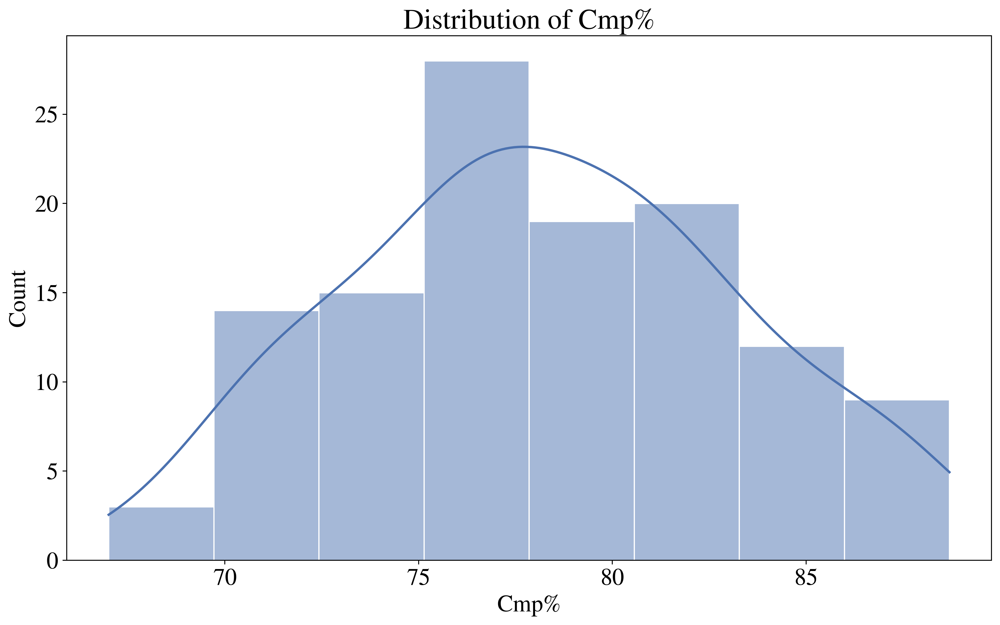

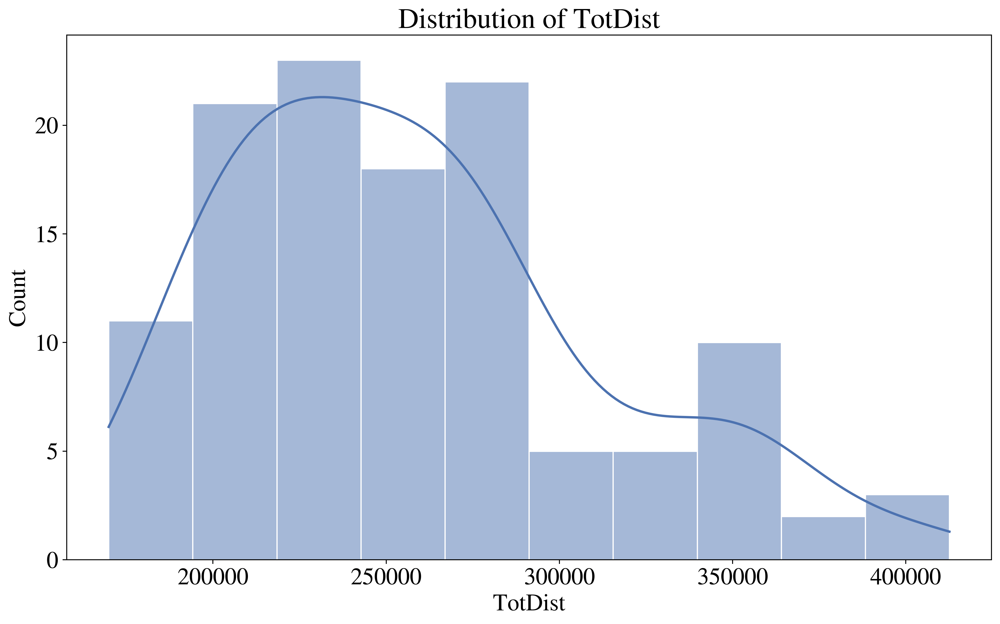

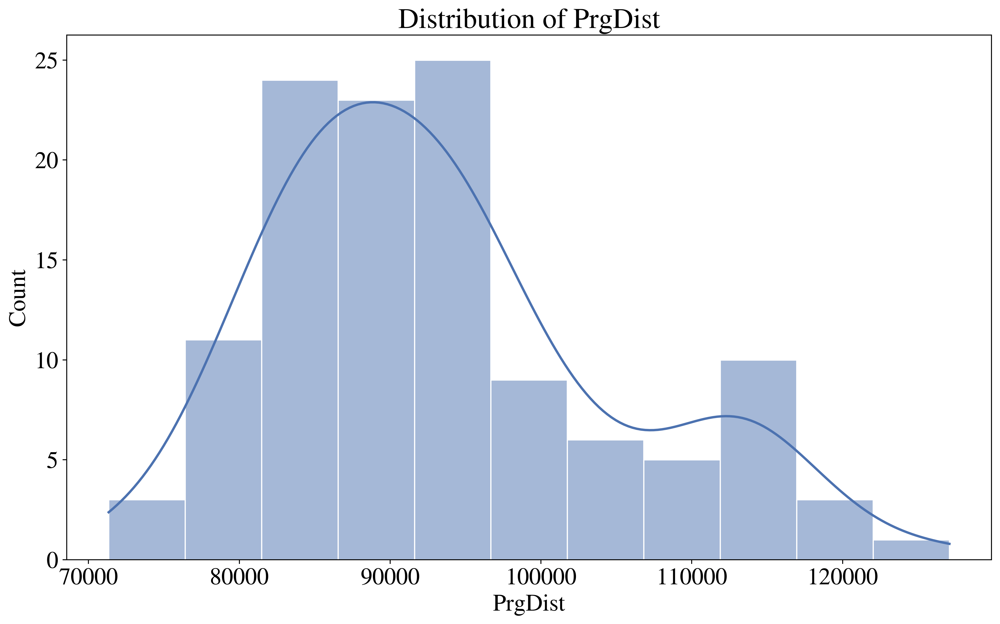

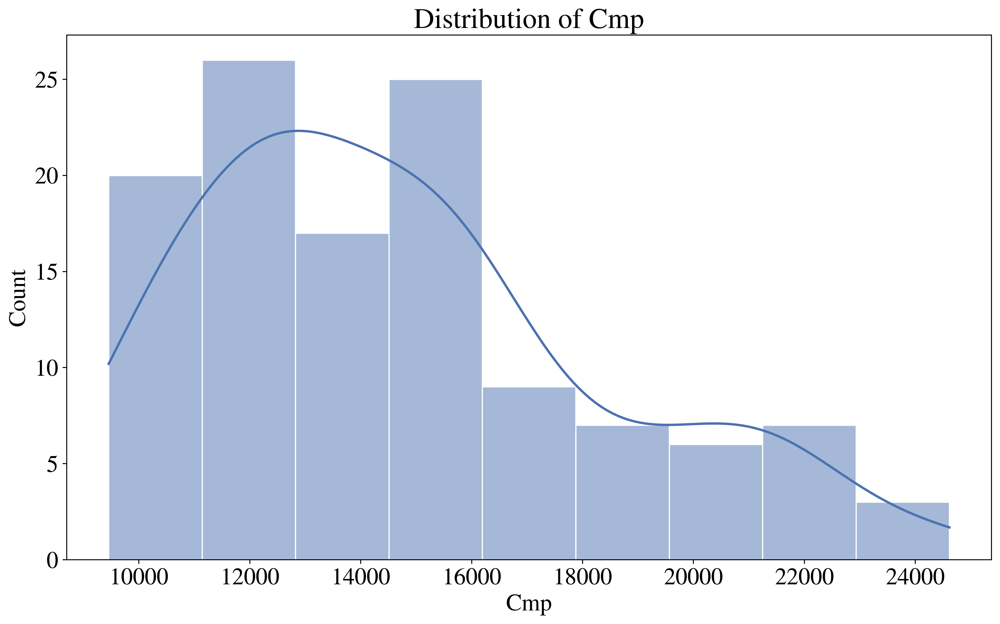

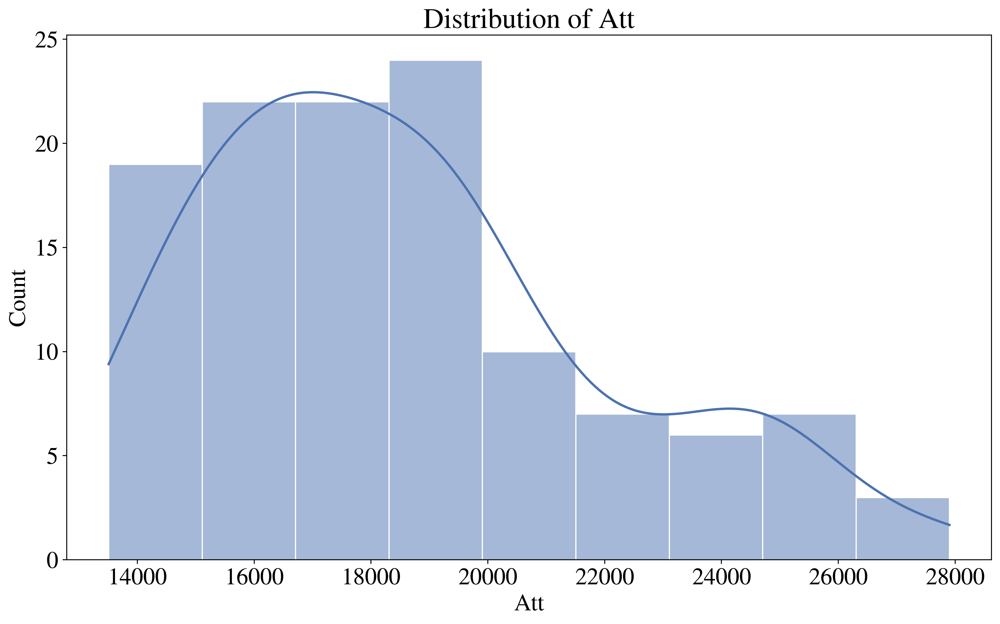

In [ ]:
# Distribution of key features
key_features = ['Cmp%', 'TotDist', 'PrgDist', 'Cmp', 'Att']
for col in key_features:
    sns.histplot(passing_combined[col], kde=True)
    plt.title(f"Distribution of {col}")
    plt.show()

In [ ]:
# Feature engineering
passing_combined['FinalThirdPassRatio'] = passing_combined['1/3'] / passing_combined['Att']
passing_combined['PrgPRatio'] = passing_combined['PrgP'] / passing_combined['Att']
passing_combined['Passes_per_game'] = passing_combined['Att'] / 38
passing_combined['ProgDist_ratio'] = passing_combined['PrgDist'] / passing_combined['TotDist']
passing_combined['Cmp_percent'] = passing_combined['Cmp%'] / 100

# Drop inf and NaN rows if any
passing_combined.replace([np.inf, -np.inf], np.nan, inplace=True)
passing_combined.dropna(inplace=True)

#Regression Model - Predict Cmp_percent using engineered features

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

# Features and target
features = ['FinalThirdPassRatio', 'PrgPRatio', 'Passes_per_game', 'ProgDist_ratio']
X = passing_combined[features]
y = passing_combined['Cmp_percent']

# Split data (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = LinearRegression()
model.fit(X_train, y_train)

# Predict on test set
y_pred = model.predict(X_test)

# Evaluate model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Linear Regression Model Performance:")
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"R-squared (R2): {r2:.4f}")

# Optional: Coefficients interpretation
coef_df = pd.DataFrame({
    'Feature': features,
    'Coefficient': model.coef_
})
print(coef_df)

Linear Regression Model Performance:
Mean Squared Error (MSE): 0.0003
R-squared (R2): 0.9175
               Feature  Coefficient
0  FinalThirdPassRatio    -0.579018
1            PrgPRatio     0.311019
2      Passes_per_game     0.000378
3       ProgDist_ratio    -0.415833


The linear regression model demonstrates strong predictive performance for pass completion percentage (Cmp_percent). With a very low mean squared error (MSE) of 0.0003 and an R-squared value of 0.9175, the model explains approximately 91.75% of the variance in completion rates, indicating a good fit to the data. The coefficients show that a higher ratio of final third passes is associated with a decrease in completion percentage, which is expected since passes in the attacking final third tend to be riskier and more difficult to complete. In contrast, a higher ratio of progressive passes per attempt positively influences completion percentage, suggesting that effective forward passing is linked to better accuracy. The number of passes per game has a minimal positive effect, while a higher ratio of progressive distance to total passing distance negatively impacts completion, likely because longer progressive passes are harder to complete accurately.

### Classification Modelling

# Oscar's code: Possession

In [ ]:
#load possession dataframe
possession_combined = pd.read_csv("possession_combined.csv")
possession_combined = possession_combined.drop('90s', axis=1)

In [ ]:
#renaming columns
new_possession_col_names = [
    'Squad', '#Players', 'Possessions', 'Touches',
    'Touches_Def_Penalty', 'Touches_Def_Third', 'Touches_Mid_Third', 'Touches_Att_Third', 'Touches_Att_Penalty',
    'Touches_Live_Ball',
    'Take_Ons_Attempted', 'Take_Ons_Successful', 'Take_Ons_Success_%', 'Take_Ons_Tkld', 'Take_Ons_Tkld_%',
    'Carries', 'Carry_Total_Distance', 'Carry_Progressive_Distance',
    'Progressive_Carries', 'Carries_Into_Final_Third', 'Carries_Into_Penalty_Area',
    'Miscontrols', 'Dispossessed',
    'Pass_Recipients', 'Progressive_Pass_Recipients',
    'League', 'Season'
]

possession_combined.columns = new_possession_col_names

possession_combined.describe()

,#Players,Possessions,Touches,Touches_Def_Penalty,Touches_Def_Third,Touches_Mid_Third,Touches_Att_Third,Touches_Att_Penalty,Touches_Live_Ball,Take_Ons_Attempted,...,Carries,Carry_Total_Distance,Carry_Progressive_Distance,Progressive_Carries,Carries_Into_Final_Third,Carries_Into_Penalty_Area,Miscontrols,Dispossessed,Pass_Recipients,Progressive_Pass_Recipients
count,120.000000,120.000000,120.000000,120.000000,120.000000,120.00000,120.00000,120.000000,120.000000,120.000000,...,120.000000,120.000000,120.000000,120.000000,120.000000,120.000000,120.000000,120.000000,120.000000,120.000000
mean,29.308333,50.000833,22755.183333,2423.975000,7351.366667,10026.40000,5591.40000,839.708333,22749.625000,666.108333,...,12743.683333,67011.725000,34469.525000,661.575000,484.850000,177.658333,566.616667,339.241667,14581.166667,1405.416667
std,3.414738,7.031962,3317.677088,279.736925,816.603449,1831.39949,1290.02701,219.020370,3316.980793,100.721081,...,2941.022114,14964.129139,8874.860812,164.892359,121.648319,69.757744,50.577702,42.973902,3627.733481,338.307045
min,23.000000,35.800000,17905.000000,1837.000000,5619.000000,6953.00000,3755.00000,498.000000,17896.000000,452.000000,...,8229.000000,41814.000000,19061.000000,346.000000,287.000000,76.000000,406.000000,245.000000,9342.000000,847.000000
25%,26.000000,44.775000,20366.750000,2220.500000,6750.500000,8726.50000,4690.50000,694.750000,20360.000000,595.500000,...,10677.250000,55950.250000,27796.250000,553.000000,392.500000,127.750000,535.750000,304.500000,11995.000000,1154.000000
50%,29.000000,49.550000,22256.000000,2400.000000,7325.000000,9673.50000,5307.00000,782.500000,22251.500000,666.000000,...,12256.000000,65770.500000,33163.000000,653.500000,470.500000,163.500000,570.000000,337.500000,13856.500000,1336.000000
75%,32.000000,53.850000,24411.000000,2630.500000,7920.750000,10993.50000,6042.50000,955.000000,24409.000000,738.000000,...,13982.500000,72885.000000,38593.250000,735.500000,544.500000,217.000000,600.000000,368.000000,16299.250000,1574.250000
max,40.000000,67.900000,31414.000000,3197.000000,9449.000000,15281.00000,10260.00000,1499.000000,31404.000000,971.000000,...,21064.000000,110018.000000,61200.000000,1145.000000,867.000000,415.000000,696.000000,471.000000,24343.000000,2402.000000


In [ ]:
#one hot encoding for squad column
possession_combined = pd.get_dummies(possession_combined, columns=['Squad'], prefix='Squad')
with pd.option_context('display.max_columns', None):
        display(possession_combined.head())

,#Players,Possessions,Touches,Touches_Def_Penalty,Touches_Def_Third,Touches_Mid_Third,Touches_Att_Third,Touches_Att_Penalty,Touches_Live_Ball,Take_Ons_Attempted,Take_Ons_Successful,Take_Ons_Success_%,Take_Ons_Tkld,Take_Ons_Tkld_%,Carries,Carry_Total_Distance,Carry_Progressive_Distance,Progressive_Carries,Carries_Into_Final_Third,Carries_Into_Penalty_Area,Miscontrols,Dispossessed,Pass_Recipients,Progressive_Pass_Recipients,League,Season,Squad_Alavés,Squad_Almería,Squad_Arsenal,Squad_Aston Villa,Squad_Athletic Club,Squad_Atlético Madrid,Squad_Barcelona,Squad_Betis,Squad_Bournemouth,Squad_Brentford,Squad_Brighton,Squad_Burnley,Squad_Celta Vigo,Squad_Chelsea,Squad_Crystal Palace,Squad_Cádiz,Squad_Elche,Squad_Espanyol,Squad_Everton,Squad_Fulham,Squad_Getafe,Squad_Girona,Squad_Granada,Squad_Las Palmas,Squad_Leeds United,Squad_Leicester City,Squad_Levante,Squad_Liverpool,Squad_Luton Town,Squad_Mallorca,Squad_Manchester City,Squad_Manchester Utd,Squad_Newcastle Utd,Squad_Norwich City,Squad_Nott'ham Forest,Squad_Osasuna,Squad_Rayo Vallecano,Squad_Real Madrid,Squad_Real Sociedad,Squad_Sevilla,Squad_Sheffield Utd,Squad_Southampton,Squad_Tottenham,Squad_Valencia,Squad_Valladolid,Squad_Villarreal,Squad_Watford,Squad_West Ham,Squad_Wolves
0,33,42.0,18371,2222,6215,8104,4235,605,18364,504,271,53.8,233,46.2,8699,42737,20539,420,310,102,616,278,9576,969,La Liga,2021-2022,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,26,48.1,21254,2066,6214,9532,5722,799,21247,530,297,56.0,232,43.8,10777,57778,30509,653,461,146,569,341,12839,1559,La Liga,2021-2022,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,26,50.6,23038,2006,6787,10729,5702,868,23033,600,383,63.8,217,36.2,12629,65613,34800,705,531,164,555,353,14978,1456,La Liga,2021-2022,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,38,64.2,28778,2236,7093,14319,7567,1055,28771,747,474,63.5,273,36.5,18228,93372,52508,961,704,280,623,358,21334,2059,La Liga,2021-2022,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,31,53.7,23691,2299,7311,10969,5603,826,23685,655,372,56.8,283,43.2,13042,66497,33876,666,482,187,588,364,15573,1501,La Liga,2021-2022,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [ ]:
numeric_df = possession_combined.apply(pd.to_numeric, errors='coerce').convert_dtypes()
numeric_df = numeric_df.drop(['Season','League'], axis=1)

numeric_df = numeric_df.select_dtypes(include='number')
corr_matrix = numeric_df.corr()
corr_matrix.head()

,#Players,Possessions,Touches,Touches_Def_Penalty,Touches_Def_Third,Touches_Mid_Third,Touches_Att_Third,Touches_Att_Penalty,Touches_Live_Ball,Take_Ons_Attempted,...,Carries,Carry_Total_Distance,Carry_Progressive_Distance,Progressive_Carries,Carries_Into_Final_Third,Carries_Into_Penalty_Area,Miscontrols,Dispossessed,Pass_Recipients,Progressive_Pass_Recipients
#Players,1.000000,-0.194309,-0.258749,0.120794,-0.024635,-0.242499,-0.304560,-0.298149,-0.258755,0.002590,...,-0.224601,-0.216945,-0.202535,-0.221228,-0.208861,-0.234435,0.190059,-0.121857,-0.240901,-0.266617
Possessions,-0.194309,1.000000,0.953813,-0.103686,0.375452,0.946903,0.871647,0.773182,0.953774,0.495399,...,0.950587,0.925610,0.921871,0.868005,0.873516,0.777192,-0.139040,0.192924,0.954067,0.930773
Touches,-0.258749,0.953813,1.000000,0.011054,0.482241,0.969879,0.890807,0.822988,1.000000,0.517238,...,0.984958,0.949466,0.937130,0.881525,0.880996,0.838703,-0.225182,0.212425,0.994278,0.924882
Touches_Def_Penalty,0.120794,-0.103686,0.011054,1.000000,0.802025,-0.141065,-0.277162,-0.142482,0.011243,0.192039,...,0.017830,0.009876,-0.015965,-0.085894,-0.194576,-0.017565,-0.061698,0.091184,0.014750,-0.223356
Touches_Def_Third,-0.024635,0.375452,0.482241,0.802025,1.000000,0.345049,0.120075,0.192963,0.482412,0.393873,...,0.469530,0.426586,0.396363,0.308476,0.210081,0.303528,-0.048261,0.215450,0.479920,0.231241


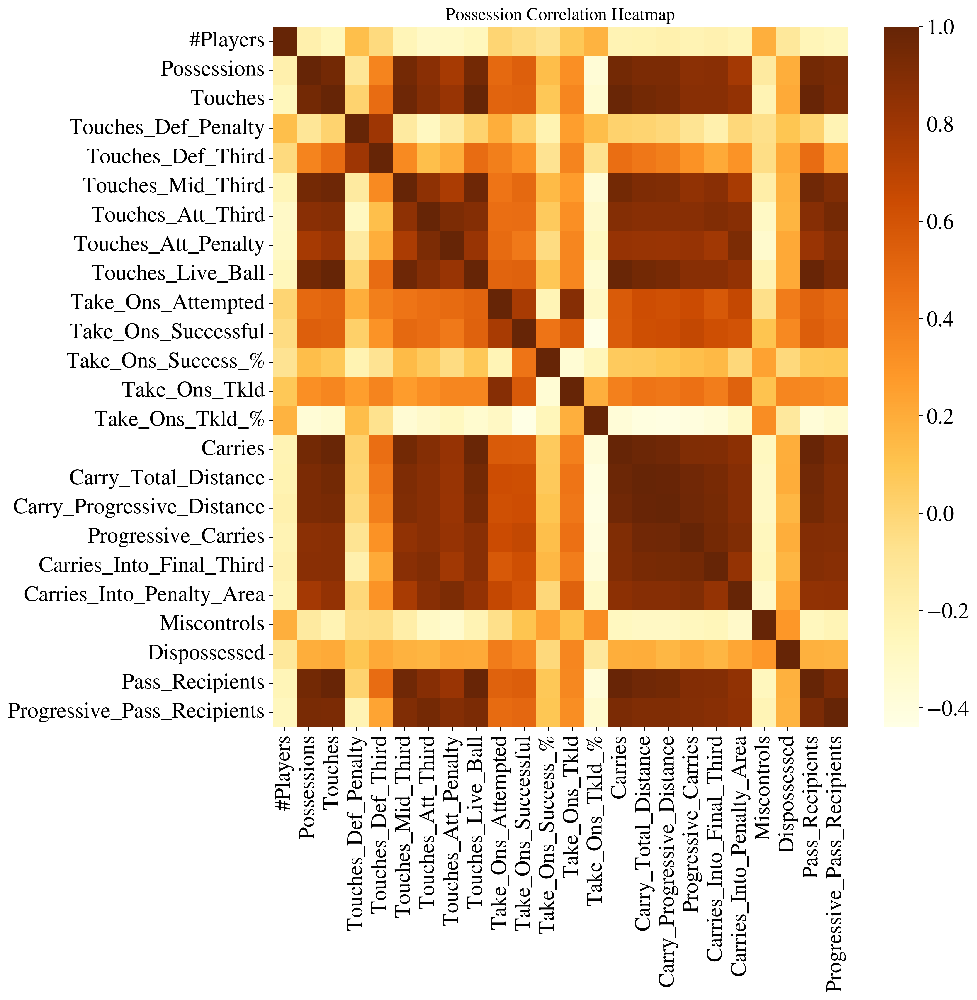

In [ ]:
# correlation matrix of possession_combined
plt.figure(figsize=(13, 13))
sns.heatmap(
    corr_matrix,
    cmap='YlOrBr',
    cbar=True
)
plt.title('Possession Correlation Heatmap', fontsize=16)
plt.tight_layout()
plt.show()

In [ ]:
possession_combined['Carry_Efficiency'] = possession_combined['Carry_Progressive_Distance'] / possession_combined['Carry_Total_Distance']
# Measures how purposeful a player’s carries are
possession_combined['Touches_in_Attacking_Areas_%'] = ((possession_combined['Touches_Att_Third'] + possession_combined['Touches_Att_Penalty']) / possession_combined['Touches'])
# Indicates attacking involvement
possession_combined['Touches_in_Defending_Areas_%'] = ((possession_combined['Touches_Def_Third'] + possession_combined['Touches_Def_Penalty']) / possession_combined['Touches'])
# Indicates defending involvement

In [ ]:
#renaming column names with '%' in them
possession_combined = possession_combined.rename(columns={
    'Take_Ons_Success_%': 'Take_Ons_Success_Pct',
    'Take_Ons_Tkld_%': 'Take_Ons_Tkld_Pct',
    'Touches_in_Attacking_Areas_%': 'Touches_Attack_Pct',
    'Touches_in_Defending_Areas_%': 'Touches_Defend_Pct'
})

Linear Regression: Predicting Possessions from Ball Control Metrics

In [ ]:
m1 = smf.ols(
    formula='Possessions ~ Touches + Carries + Pass_Recipients + Touches_Live_Ball + Dispossessed',
    data=possession_combined
).fit()

print(m1.summary())

                            OLS Regression Results                            
Dep. Variable:            Possessions   R-squared:                       0.916
Model:                            OLS   Adj. R-squared:                  0.912
Method:                 Least Squares   F-statistic:                     248.0
Date:                Tue, 27 May 2025   Prob (F-statistic):           1.62e-59
Time:                        09:35:05   Log-Likelihood:                -255.35
No. Observations:                 120   AIC:                             522.7
Df Residuals:                     114   BIC:                             539.4
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
Intercept            10.6979      5.40

I modeled Possessions using five predictors: Touches, Carries, Pass_Recipients, Touches_Live_Ball, and Dispossessed. The model achieved a high R-squared of 0.916, meaning it explains 91.6% of the variation in possessions. While the overall model is statistically significant (F = 248.0, p < 0.001), none of the individual predictors are significant. The Omnibus (1.456, p = 0.483) and Jarque-Bera (1.348, p = 0.510) tests suggest residuals are normally distributed, and the Durbin-Watson statistic (1.617) indicates no strong autocorrelation.

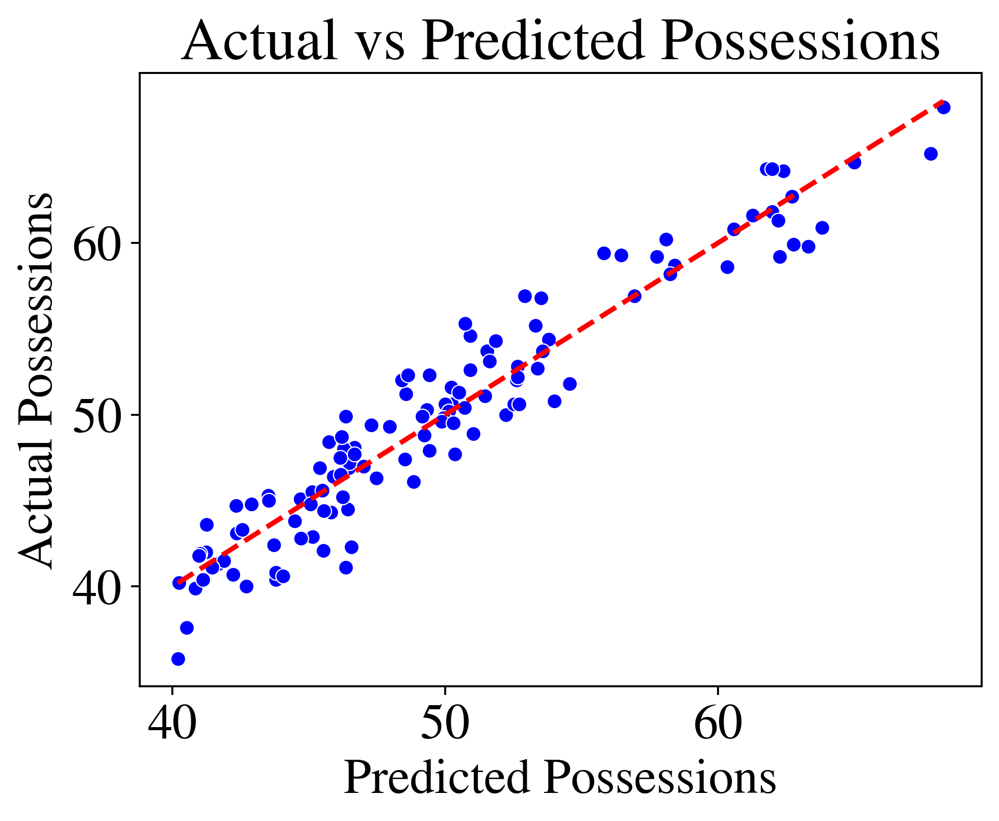

In [ ]:
plt.figure(figsize=(6, 5))
sns.scatterplot(x=m1.fittedvalues, y=possession_combined['Possessions'], color='blue', edgecolor='white')
plt.plot([min(m1.fittedvalues), max(m1.fittedvalues)], [min(m1.fittedvalues), max(m1.fittedvalues)], color='red', linestyle='--')
plt.xlabel('Predicted Possessions')
plt.ylabel('Actual Possessions')
plt.title('Actual vs Predicted Possessions')
plt.tight_layout()
plt.show()

Predicting Possessions: KNN vs Linear Regression:

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import mean_squared_error, r2_score

features = ['Touches', 'Carries', 'Pass_Recipients', 'Touches_Live_Ball', 'Dispossessed']
X = possession_combined[features]
y = possession_combined['Possessions']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

lr = LinearRegression()
lr.fit(X_train, y_train)
y_pred_lr = lr.predict(X_test)

mse_lr = mean_squared_error(y_test, y_pred_lr)
r2_lr = r2_score(y_test, y_pred_lr)

knn = KNeighborsRegressor(n_neighbors=6)
knn.fit(X_train, y_train)
y_pred_knn = knn.predict(X_test)

mse_knn = mean_squared_error(y_test, y_pred_knn)
r2_knn = r2_score(y_test, y_pred_knn)

print(f"Linear Regression - MSE: {mse_lr:.2f}, R²: {r2_lr:.3f}")
print(f"KNN Regression     - MSE: {mse_knn:.2f}, R²: {r2_knn:.3f}")

Linear Regression - MSE: 4.03, R²: 0.931
KNN Regression     - MSE: 5.32, R²: 0.910


I compared a linear regression model and a KNN(k=6) model for predicting Possessions. The linear regression model performed better than KNN, achieving an R² of 0.931 and MSE of 4.03, compared to R² of 0.910 and MSE of 5.32 for KNN. This suggests that the relationship between the predictors and possessions is largely linear

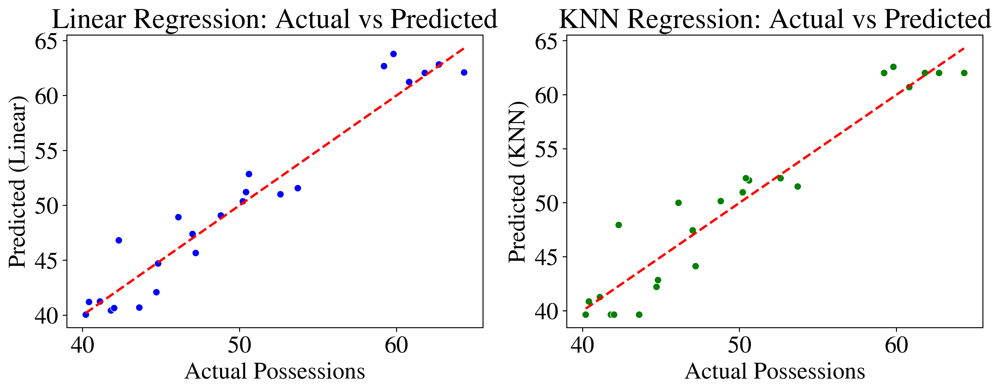

In [ ]:
results_df = pd.DataFrame({
    'Actual': y_test,
    'Linear_Predicted': y_pred_lr,
    'KNN_Predicted': y_pred_knn,
    'Linear_Residuals': y_test - y_pred_lr,
    'KNN_Residuals': y_test - y_pred_knn
})

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
sns.scatterplot(x=results_df['Actual'], y=results_df['Linear_Predicted'], color='blue')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel("Actual Possessions")
plt.ylabel("Predicted (Linear)")
plt.title("Linear Regression: Actual vs Predicted")

plt.subplot(1, 2, 2)
sns.scatterplot(x=results_df['Actual'], y=results_df['KNN_Predicted'], color='green')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel("Actual Possessions")
plt.ylabel("Predicted (KNN)")
plt.title("KNN Regression: Actual vs Predicted")

plt.tight_layout()
plt.show()

Classifying League: Logistic Regression VS Random Forest VS Naive Bayes

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import accuracy_score, classification_report

possession_combined['League'] = LabelEncoder().fit_transform(possession_combined['League'])

features = [
    'Touches',
    'Carries',
    'Progressive_Pass_Recipients',
    'Carry_Efficiency'
]

X = possession_combined[features]
y = possession_combined['League']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# LOGISTIC REGRESSION
log_reg = LogisticRegression(max_iter=1000)
log_reg.fit(X_train_scaled, y_train)
y_pred_log = log_reg.predict(X_test_scaled)

acc_log = accuracy_score(y_test, y_pred_log)
print("\nLOGISTIC REGRESSION:")
print(classification_report(y_test, y_pred_log, target_names=["La Liga", "Premier League"]))

# RANDOM FOREST
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train_scaled, y_train)
y_pred_rf = rf.predict(X_test_scaled)

acc_rf = accuracy_score(y_test, y_pred_rf)
print("\nRANDOM FOREST:")
print(classification_report(y_test, y_pred_rf, target_names=["La Liga", "Premier League"]))

# GAUSSIAN NAIVE BAYES
nb = GaussianNB()
nb.fit(X_train_scaled, y_train)
y_pred_nb = nb.predict(X_test_scaled)

acc_nb = accuracy_score(y_test, y_pred_nb)
print("\nGAUSSIAN NAIVE BAYES:")
print(classification_report(y_test, y_pred_nb, target_names=["La Liga", "Premier League"]))



LOGISTIC REGRESSION:
                precision    recall  f1-score   support

       La Liga       0.67      0.46      0.55        13
Premier League       0.53      0.73      0.62        11

      accuracy                           0.58        24
     macro avg       0.60      0.59      0.58        24
  weighted avg       0.61      0.58      0.58        24


RANDOM FOREST:
                precision    recall  f1-score   support

       La Liga       0.67      0.77      0.71        13
Premier League       0.67      0.55      0.60        11

      accuracy                           0.67        24
     macro avg       0.67      0.66      0.66        24
  weighted avg       0.67      0.67      0.66        24


GAUSSIAN NAIVE BAYES:
                precision    recall  f1-score   support

       La Liga       0.65      0.85      0.73        13
Premier League       0.71      0.45      0.56        11

      accuracy                           0.67        24
     macro avg       0.68      0.65

I compared 3 models to classify teams as La Liga or Premier League using four possession features: Touches, Carries, Progressive_Pass_Recipients, and Carry_Efficiency. Naive Bayes matched Random Forest in accuracy at 67%, while Logistic Regression scored 58%

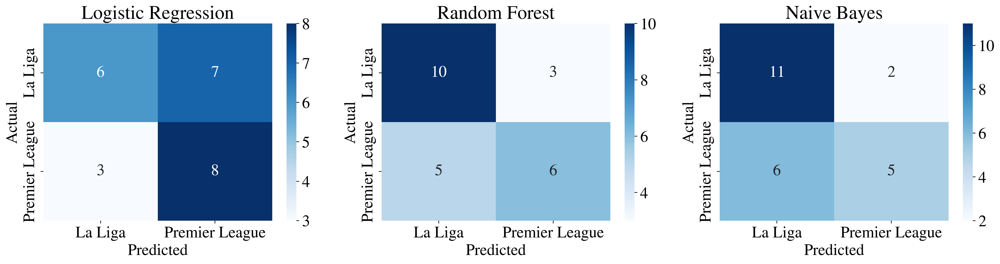

In [ ]:
from sklearn.metrics import confusion_matrix

cm_log = confusion_matrix(y_test, y_pred_log)
cm_rf = confusion_matrix(y_test, y_pred_rf)
cm_nb = confusion_matrix(y_test, y_pred_nb)

labels = ["La Liga", "Premier League"]

plt.figure(figsize=(18, 5))

plt.subplot(1, 3, 1)
sns.heatmap(cm_log, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.title('Logistic Regression')
plt.xlabel('Predicted')
plt.ylabel('Actual')

plt.subplot(1, 3, 2)
sns.heatmap(cm_rf, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.title('Random Forest')
plt.xlabel('Predicted')
plt.ylabel('Actual')

plt.subplot(1, 3, 3)
sns.heatmap(cm_nb, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.title('Naive Bayes')
plt.xlabel('Predicted')
plt.ylabel('Actual')

plt.tight_layout()
plt.show()

# Oscar's Code: Playtime


In [ ]:
playtime_combined = pd.read_csv("playtime_combined.csv")
playtime_combined = playtime_combined.drop('90s', axis=1)
#renaming playtime columns
new_playtime_col_names = [
    'Squad', '#Players', 'Average_Age',
    'Matches_Played', 'Minutes_Played', 'Minutes_Per_Match', 'Minutes_Percentage',
    'Starts', 'Minutes_Per_Start', 'Complete_Matches',
    'Sub_Appearances', 'Minutes_Per_Sub', 'Unused_Sub_Appearances',
    'Points_Per_Match', 'Goals_For_On_Pitch', 'Goals_Against_On_Pitch', 'Goal_Difference_On_Pitch', 'Goal_Difference_Per_90',
    'Expected_Goals_For_On_Pitch', 'Expected_Goals_Against_On_Pitch', 'Expected_Goals_Difference_On_Pitch', 'Expected_Goals_Difference_Per_90',
    'League', 'Season'
]

playtime_combined.columns = new_playtime_col_names

#one hot encoding playtime squad column
playtime_combined = pd.get_dummies(playtime_combined, columns=['Squad'], prefix='Squad')
with pd.option_context('display.max_columns', None):
        display(playtime_combined.head())

playtime_combined['Premier League'] = playtime_combined['League'].map({'La Liga': 0, 'Premier League': 1})
playtime_combined['La Liga'] = playtime_combined['League'].map({'La Liga': 1, 'Premier League': 0})
playtime_combined.rename(columns={'Premier League': 'Premier_League', 'La Liga': 'La_Liga'}, inplace=True)

,# Pl,Age,MP,Min,Mn/MP,Min%,90s,Starts,Mn/Start,Compl,Subs,Mn/Sub,unSub,PPM,onG,onGA,+/-,+/-90,onxG,onxGA,xG+/-,xG+/-90,League,Season,Squad_Alavés,Squad_Almería,Squad_Arsenal,Squad_Aston Villa,Squad_Athletic Club,Squad_Atlético Madrid,Squad_Barcelona,Squad_Betis,Squad_Bournemouth,Squad_Brentford,Squad_Brighton,Squad_Burnley,Squad_Celta Vigo,Squad_Chelsea,Squad_Crystal Palace,Squad_Cádiz,Squad_Elche,Squad_Espanyol,Squad_Everton,Squad_Fulham,Squad_Getafe,Squad_Girona,Squad_Granada,Squad_Las Palmas,Squad_Leeds United,Squad_Leicester City,Squad_Levante,Squad_Liverpool,Squad_Luton Town,Squad_Mallorca,Squad_Manchester City,Squad_Manchester Utd,Squad_Newcastle Utd,Squad_Norwich City,Squad_Nott'ham Forest,Squad_Osasuna,Squad_Rayo Vallecano,Squad_Real Madrid,Squad_Real Sociedad,Squad_Sevilla,Squad_Sheffield Utd,Squad_Southampton,Squad_Tottenham,Squad_Valencia,Squad_Valladolid,Squad_Villarreal,Squad_Watford,Squad_West Ham,Squad_Wolves
0,33,27.9,38,3420,90,100,38.0,418,82,247,167,20,277,0.82,31,65,-34,-0.89,37.3,57.0,-19.7,-0.52,La Liga,2021-2022,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
1,26,26.9,38,3420,90,100,38.0,418,81,237,180,21,209,1.45,43,36,7,0.18,49.6,38.4,11.3,0.3,La Liga,2021-2022,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
2,26,28.1,38,3420,90,100,38.0,418,79,244,170,26,159,1.87,65,43,22,0.58,54.4,33.4,21.1,0.56,La Liga,2021-2022,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
3,38,26.2,38,3420,90,100,38.0,418,82,254,159,20,264,1.92,68,38,30,0.79,63.4,34.4,29.0,0.76,La Liga,2021-2022,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
4,31,28.9,38,3420,90,100,38.0,418,82,251,161,21,266,1.71,62,40,22,0.58,53.5,43.4,10.1,0.27,La Liga,2021-2022,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False


In [ ]:
numuseric_df = playtime_combined.apply(pd.to_numeric, errors='coerce').convert_dtypes()
numeric_df = numeric_df.drop(['Season', 'League'], axis=1, errors='ignore')
numeric_df = numeric_df.dropna(axis=1, how='all')
numeric_df = numeric_df.select_dtypes(include='number')
numeric_df = numeric_df.loc[:, numeric_df.nunique() > 1]

corr_matrix = numeric_df.corr()
corr_matrix.head()

,#Players,Possessions,Touches,Touches_Def_Penalty,Touches_Def_Third,Touches_Mid_Third,Touches_Att_Third,Touches_Att_Penalty,Touches_Live_Ball,Take_Ons_Attempted,...,Carries,Carry_Total_Distance,Carry_Progressive_Distance,Progressive_Carries,Carries_Into_Final_Third,Carries_Into_Penalty_Area,Miscontrols,Dispossessed,Pass_Recipients,Progressive_Pass_Recipients
#Players,1.000000,-0.194309,-0.258749,0.120794,-0.024635,-0.242499,-0.304560,-0.298149,-0.258755,0.002590,...,-0.224601,-0.216945,-0.202535,-0.221228,-0.208861,-0.234435,0.190059,-0.121857,-0.240901,-0.266617
Possessions,-0.194309,1.000000,0.953813,-0.103686,0.375452,0.946903,0.871647,0.773182,0.953774,0.495399,...,0.950587,0.925610,0.921871,0.868005,0.873516,0.777192,-0.139040,0.192924,0.954067,0.930773
Touches,-0.258749,0.953813,1.000000,0.011054,0.482241,0.969879,0.890807,0.822988,1.000000,0.517238,...,0.984958,0.949466,0.937130,0.881525,0.880996,0.838703,-0.225182,0.212425,0.994278,0.924882
Touches_Def_Penalty,0.120794,-0.103686,0.011054,1.000000,0.802025,-0.141065,-0.277162,-0.142482,0.011243,0.192039,...,0.017830,0.009876,-0.015965,-0.085894,-0.194576,-0.017565,-0.061698,0.091184,0.014750,-0.223356
Touches_Def_Third,-0.024635,0.375452,0.482241,0.802025,1.000000,0.345049,0.120075,0.192963,0.482412,0.393873,...,0.469530,0.426586,0.396363,0.308476,0.210081,0.303528,-0.048261,0.215450,0.479920,0.231241


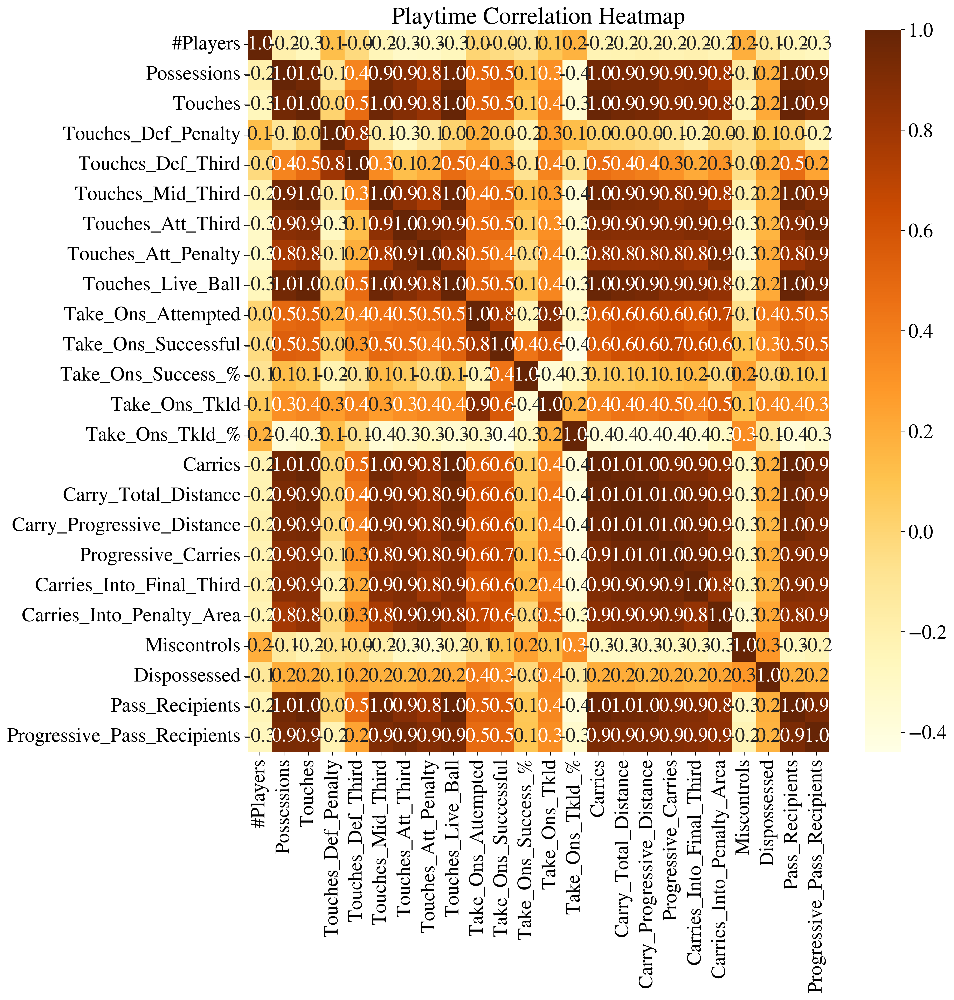

In [ ]:
#correlation matrix of playtime dataframe
plt.figure(figsize=(13, 13))
sns.heatmap(
    corr_matrix,
    cmap='YlOrBr',
    cbar=True
)
plt.title('Playtime Correlation Heatmap', fontsize=16)
plt.tight_layout()
plt.show()

In [ ]:
playtime_combined['Avg_Minutes_Per_Player'] = playtime_combined['Minutes_Played'] / playtime_combined['#Players']
# Average minutes of play per player
playtime_combined['Goals_Per_Match'] = playtime_combined['Goals_For_On_Pitch'] / playtime_combined['Matches_Played']
# Average goals per match
playtime_combined['Goal_Diff_Per_Match'] = playtime_combined['Goal_Difference_On_Pitch'] / playtime_combined['Matches_Played']
# Average goal difference per match


KeyError: 'Minutes_Played'

In [ ]:
m2 = smf.ols(
    formula='Points_Per_Match ~ Complete_Matches + Sub_Appearances + Minutes_Per_Start + Unused_Sub_Appearances + Average_Age',
    data=playtime_combined
).fit()

print(m2.summary())

PatsyError: Error evaluating factor: NameError: name 'Unused_Sub_Appearances' is not defined
    Points_Per_Match ~ Complete_Matches + Sub_Appearances + Minutes_Per_Start + Unused_Sub_Appearances + Average_Age
                                                                                ^^^^^^^^^^^^^^^^^^^^^^

Linear Regression: Points per match from Ball Control Metrics

In [ ]:
m2 = smf.ols(
    formula='Points_Per_Match ~ Complete_Matches + Sub_Appearances + Minutes_Per_Start + Unused_Sub_Appearances + Average_Age',
    data=playtime_combined
).fit()

print(m2.summary())

PatsyError: Error evaluating factor: NameError: name 'Unused_Sub_Appearances' is not defined
    Points_Per_Match ~ Complete_Matches + Sub_Appearances + Minutes_Per_Start + Unused_Sub_Appearances + Average_Age
                                                                                ^^^^^^^^^^^^^^^^^^^^^^

In [ ]:
print(playtime_combined.columns)


I modeled Points_Per_Match using five predictors: Complete_Matches, Sub_Appearances, Minutes_Per_Start, Unused_Sub_Appearances, and Average_Age. The model achieved a low R-squared of 0.055, meaning it explains only 5.5% of the variation in points per match. None of the individual predictors are significant. The Omnibus (5.466, p = 0.065) and Jarque-Bera (5.407, p = 0.067) tests suggest the residuals are approximately normally distributed, and the Durbin-Watson statistic (1.594) indicates no strong autocorrelation.

In [ ]:
plt.figure(figsize=(6, 5))
sns.scatterplot(x=m2.fittedvalues, y=playtime_combined['Points_Per_Match'], color='teal', edgecolor='white')
plt.plot([min(m2.fittedvalues), max(m2.fittedvalues)], [min(m2.fittedvalues), max(m2.fittedvalues)], 'r--')
plt.xlabel('Predicted Points Per Match')
plt.ylabel('Actual Points Per Match')
plt.title('Actual vs Predicted Points Per Match')
plt.tight_layout()
plt.show()

Predicting Points_Per_Match: KNN vs Linear Regression:

In [ ]:
features = ['Complete_Matches', 'Sub_Appearances', 'Minutes_Per_Start', 'Unused_Sub_Appearances', 'Average_Age']
X = playtime_combined[features]
y = playtime_combined['Points_Per_Match']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

lr = LinearRegression()
lr.fit(X_train_scaled, y_train)
y_pred_lr = lr.predict(X_test_scaled)

mse_lr = mean_squared_error(y_test, y_pred_lr)
r2_lr = r2_score(y_test, y_pred_lr)

knn = KNeighborsRegressor(n_neighbors=5)
knn.fit(X_train_scaled, y_train)
y_pred_knn = knn.predict(X_test_scaled)

mse_knn = mean_squared_error(y_test, y_pred_knn)
r2_knn = r2_score(y_test, y_pred_knn)

print(f"Linear Regression - MSE: {mse_lr:.2f}, R²: {r2_lr:.3f}")
print(f"KNN Regression     - MSE: {mse_knn:.2f}, R²: {r2_knn:.3f}")

I compared Linear Regression and KNN Regression (k=5) to predict Points Per Match using five playtime-related features: Complete_Matches, Sub_Appearances, Minutes_Per_Start, Unused_Sub_Appearances, and Average_Age. KNN Regression outperformed Linear Regression, achieving a lower mean squared error and a higher R². This suggests that non-linear patterns may better capture the relationship between playtime characteristics and team performance.

In [ ]:
results_df = pd.DataFrame({
    'Actual': y_test,
    'Linear_Predicted': y_pred_lr,
    'KNN_Predicted': y_pred_knn,
    'Linear_Residuals': y_test - y_pred_lr,
    'KNN_Residuals': y_test - y_pred_knn
})

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
sns.scatterplot(x=results_df['Actual'], y=results_df['Linear_Predicted'], color='dodgerblue')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel("Actual Points Per Match")
plt.ylabel("Predicted (Linear)")
plt.title("Linear Regression: Actual vs Predicted")

plt.subplot(1, 2, 2)
sns.scatterplot(x=results_df['Actual'], y=results_df['KNN_Predicted'], color='seagreen')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.xlabel("Actual Points Per Match")
plt.ylabel("Predicted (KNN)")
plt.title("KNN Regression (k=5): Actual vs Predicted")

plt.tight_layout()
plt.show()

Classifying League: Logistic Regression VS Random Forest VS Naive Bayes

In [ ]:
playtime_combined['League'] = LabelEncoder().fit_transform(playtime_combined['League'])

features = [
    'Complete_Matches',
    'Sub_Appearances',
    'Minutes_Per_Start',
    'Unused_Sub_Appearances',
    'Average_Age'
]

X = playtime_combined[features]
y = playtime_combined['League']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

#LOGISTIC REGRESSION
log_reg = LogisticRegression(max_iter=1000)
log_reg.fit(X_train_scaled, y_train)
y_pred_log = log_reg.predict(X_test_scaled)

acc_log = accuracy_score(y_test, y_pred_log)
print("LOGISTIC REGRESSION:")
print(classification_report(y_test, y_pred_log, target_names=["La Liga", "Premier League"]))

#RANDOM FOREST
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train_scaled, y_train)
y_pred_rf = rf.predict(X_test_scaled)

acc_rf = accuracy_score(y_test, y_pred_rf)
print("\nRANDOM FOREST:")
print(classification_report(y_test, y_pred_rf, target_names=["La Liga", "Premier League"]))

#GAUSSIAN NAIVE BAYES
nb = GaussianNB()
nb.fit(X_train_scaled, y_train)
y_pred_nb = nb.predict(X_test_scaled)

acc_nb = accuracy_score(y_test, y_pred_nb)
print("\nGAUSSIAN NAIVE BAYES:")
print(classification_report(y_test, y_pred_nb, target_names=["La Liga", "Premier League"]))

I compared Logistic Regression, Random Forest, and Gaussian Naive Bayes to classify teams as La Liga or Premier League based on five playtime features: Complete_Matches, Sub_Appearances, Minutes_Per_Start, Unused_Sub_Appearances, and Average_Age. Logistic Regression performed best, achieving 96% accuracy and perfectly balanced F1 scores for both classes. Random Forest followed closely with 92% accuracy, slightly favoring La Liga in recall. Gaussian Naive Bayes was the least accurate but still respectable, with a macro F1 score of 0.87.
These results suggest that playtime metrics are strong predictors of league identity, with logistic regression providing the most reliable and balanced performance.

In [ ]:
cm_log = confusion_matrix(y_test, y_pred_log)
cm_rf = confusion_matrix(y_test, y_pred_rf)
cm_nb = confusion_matrix(y_test, y_pred_nb)

labels = ["La Liga", "Premier League"]

plt.figure(figsize=(18, 5))

plt.subplot(1, 3, 1)
sns.heatmap(cm_log, annot=True, fmt='d', cmap='Greens', xticklabels=labels, yticklabels=labels)
plt.title('Logistic Regression')
plt.xlabel('Predicted')
plt.ylabel('Actual')

plt.subplot(1, 3, 2)
sns.heatmap(cm_rf, annot=True, fmt='d', cmap='Greens', xticklabels=labels, yticklabels=labels)
plt.title('Random Forest')
plt.xlabel('Predicted')
plt.ylabel('Actual')

plt.subplot(1, 3, 3)
sns.heatmap(cm_nb, annot=True, fmt='d', cmap='Greens', xticklabels=labels, yticklabels=labels)
plt.title('Naive Bayes')
plt.xlabel('Predicted')
plt.ylabel('Actual')

plt.tight_layout()
plt.show()